**SegResNet, FedAdam**

**Imports & Drive Mount**

In [ ]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [ ]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [ ]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/ResNet/Federated_ResNet3D_checkpoints"
log_dir = "D:/F25-156/ResNet/Federated_ResNet3D_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/ResNet/Federated_ResNet3D_logs"

Checkpoints will be saved to: D:/F25-156/ResNet/Federated_ResNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/ResNet/Federated_ResNet3D_logs
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6011 (pid 11024), started 1 day, 7:28:35 ago. (Use '!kill 11024' to kill it.)

In [ ]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [ ]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [ ]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [ ]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


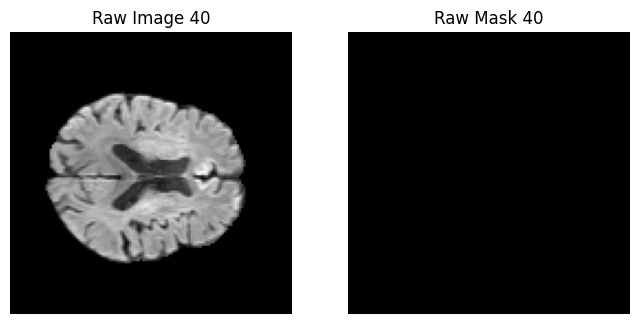

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


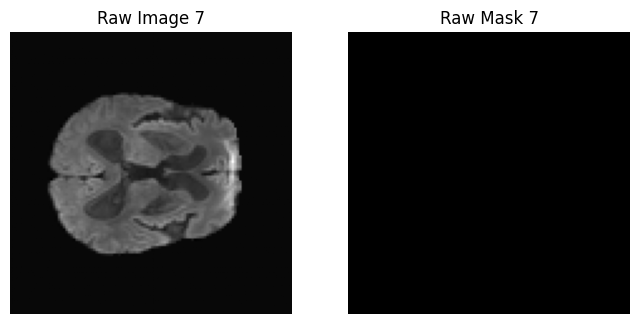

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


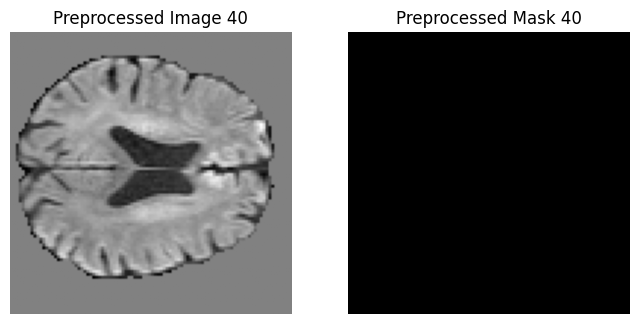

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


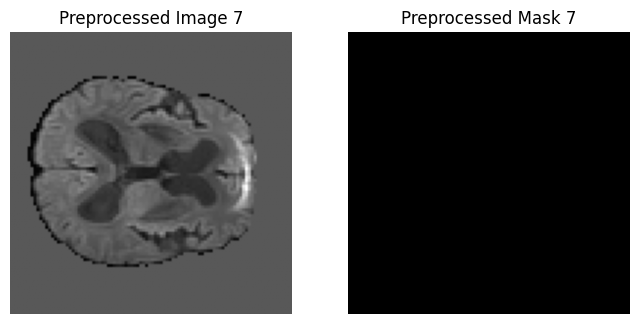

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


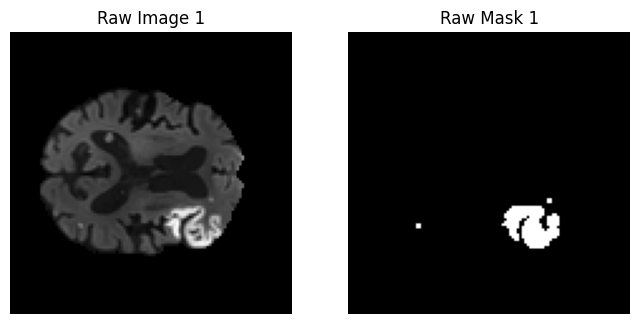

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


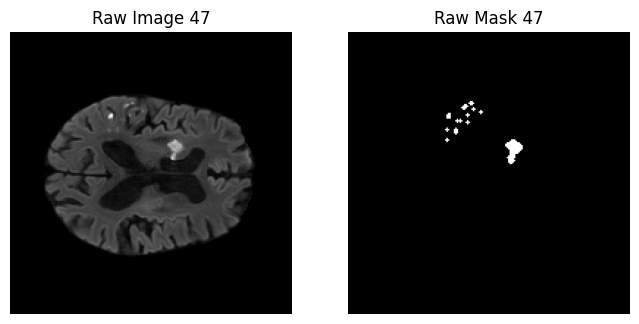

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


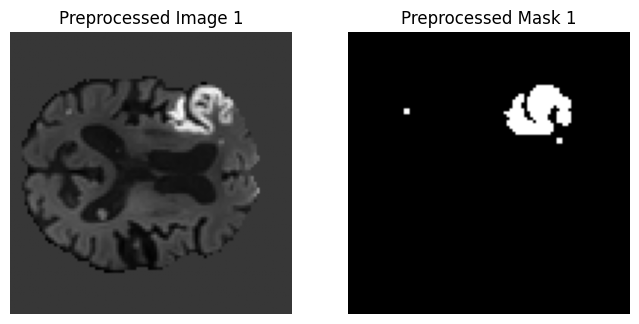

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


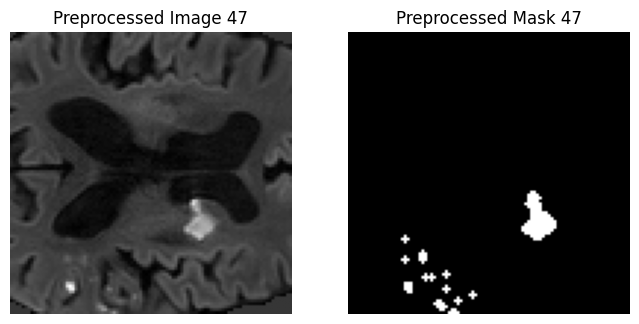

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


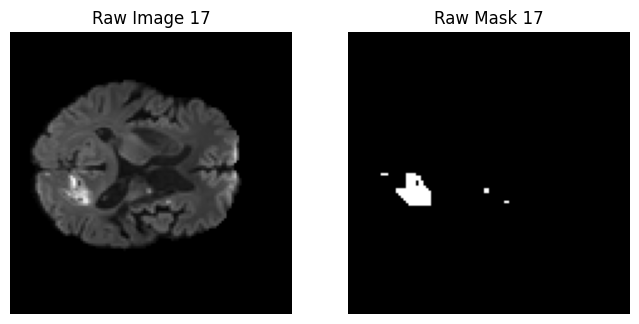

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


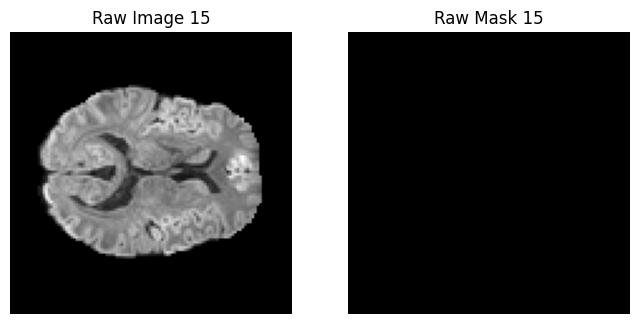

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


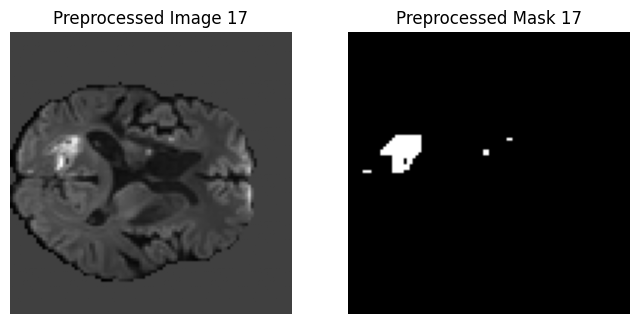

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


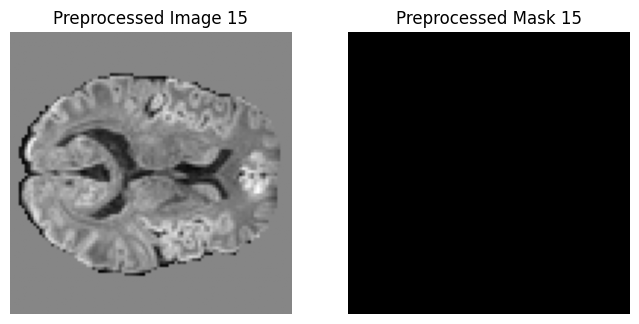

Client 2 samples: 50


In [ ]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [ ]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


ResNet

In [ ]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [ ]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

**Client Class**

In [ ]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)


        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [ ]:
class Server:
    def __init__(self, val_loader, device, lr=1e-3, beta1=0.9, beta2=0.999, eps=1e-8):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

         # FedAdam
        self.lr = lr
        self.beta1 = beta1
        self.beta2 = beta2
        self.eps = eps

        # Adam states
        self.m = {}
        self.v = {}

        for k, v in self.global_model.state_dict().items():
            if v.dtype != torch.long:
                self.m[k] = torch.zeros_like(v)
                self.v[k] = torch.zeros_like(v)


        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):

    global_params = self.global_model.state_dict()
    new_params = {}

    for key in global_params.keys():

        # skip non-float tensors (e.g., num_batches_tracked)
        if not torch.is_floating_point(global_params[key]):
            new_params[key] = global_params[key]
            continue

        # ---- Step 1: find delta = (new client - old global) for each client and compute Δt = average(all deltas) ----
        delta = torch.zeros_like(global_params[key])

        for client in client_params_list:
            delta += client[key].to(self.device) - global_params[key]

        delta /= len(client_params_list)   # |S|

        # ---- Step 2: update first moment (mt) ----
        self.m[key] = self.beta1 * self.m[key] + (1 - self.beta1) * delta

        # ---- Step 3: update second moment (vt) ----
        self.v[key] = self.beta2 * self.v[key] + (1 - self.beta2) * (delta ** 2)

        # ---- Step 4: update global model ----
        update = self.lr * self.m[key] / (torch.sqrt(self.v[key]) + self.eps)

        new_params[key] = global_params[key] + update

    self.global_model.load_state_dict(new_params)

    # def aggregate(self, client_params_list):

    #     global_params = self.global_model.state_dict()

    #     # Step 1: compute FedAvg weights
    #     avg_params = copy.deepcopy(client_params_list[0])

    #     for key in avg_params.keys():
    #         for i in range(1, len(client_params_list)):
    #             avg_params[key] += client_params_list[i][key]
    #         avg_params[key] /= len(client_params_list)

    #     # Step 2: compute delta
    #     new_params = {}

    #     for key in global_params.keys():

    #         # skip integer tensors (like num_batches_tracked)
    #         if global_params[key].dtype == torch.long:
    #             new_params[key] = global_params[key]
    #             continue

    #         avg_param = avg_params[key].to(self.device)

    #         delta = avg_param - global_params[key]

    #         # Adam momentum
    #         self.m[key] = self.beta1 * self.m[key] + (1 - self.beta1) * delta
    #         self.v[key] = self.beta2 * self.v[key] + (1 - self.beta2) * (delta ** 2)

    #         update = self.lr * self.m[key] / (torch.sqrt(self.v[key]) + self.eps)

    #         new_params[key] = global_params[key] + update

    #     self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Using device: cuda
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(

**Federated Training loop**

In [ ]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8493 | Dice: 0.1013 | IoU: 0.0534 | HD95: 43.2280


Client 0 | Epoch 2/20 | Loss: 0.8277 | Dice: 0.1602 | IoU: 0.0871 | HD95: 36.9940


Client 0 | Epoch 3/20 | Loss: 0.8196 | Dice: 0.1797 | IoU: 0.0987 | HD95: 35.7079


Client 0 | Epoch 4/20 | Loss: 0.8140 | Dice: 0.2024 | IoU: 0.1126 | HD95: 34.8801


Client 0 | Epoch 5/20 | Loss: 0.8076 | Dice: 0.2051 | IoU: 0.1143 | HD95: 33.8398


Client 0 | Epoch 6/20 | Loss: 0.8039 | Dice: 0.2205 | IoU: 0.1239 | HD95: 34.3536


Client 0 | Epoch 7/20 | Loss: 0.7986 | Dice: 0.2276 | IoU: 0.1284 | HD95: 34.2419


Client 0 | Epoch 8/20 | Loss: 0.7934 | Dice: 0.2510 | IoU: 0.1435 | HD95: 31.9400


Client 0 | Epoch 9/20 | Loss: 0.7894 | Dice: 0.2560 | IoU: 0.1468 | HD95: 30.8912


Client 0 | Epoch 10/20 | Loss: 0.7851 | Dice: 0.2730 | IoU: 0.1581 | HD95: 30.7456


Client 0 | Epoch 11/20 | Loss: 0.7827 | Dice: 0.2695 | IoU: 0.1558 | HD95: 32.2095


Client 0 | Epoch 12/20 | Loss: 0.7781 | Dice: 0.2653 | IoU: 0.1529 | HD95: 31.3822


Client 0 | Epoch 13/20 | Loss: 0.7740 | Dice: 0.2902 | IoU: 0.1697 | HD95: 30.9205


Client 0 | Epoch 14/20 | Loss: 0.7705 | Dice: 0.2939 | IoU: 0.1723 | HD95: 30.2122


Client 0 | Epoch 15/20 | Loss: 0.7667 | Dice: 0.3317 | IoU: 0.1989 | HD95: 26.8032


Client 0 | Epoch 16/20 | Loss: 0.7629 | Dice: 0.2979 | IoU: 0.1750 | HD95: 27.7265


Client 0 | Epoch 17/20 | Loss: 0.7601 | Dice: 0.2961 | IoU: 0.1738 | HD95: 29.3904


Client 0 | Epoch 18/20 | Loss: 0.7561 | Dice: 0.3402 | IoU: 0.2050 | HD95: 27.5746


Client 0 | Epoch 19/20 | Loss: 0.7532 | Dice: 0.3341 | IoU: 0.2005 | HD95: 28.6406


Clients Training:  33%|███▎      | 1/3 [02:43<05:26, 163.06s/it]

Client 0 | Epoch 20/20 | Loss: 0.7489 | Dice: 0.3735 | IoU: 0.2296 | HD95: 25.8272
Client 0 | Loss=0.7871 | Dice=0.3735 | IoU=0.2296 | HD95=25.8272


Client 1 | Epoch 1/20 | Loss: 0.8478 | Dice: 0.1066 | IoU: 0.0563 | HD95: 39.4867


Client 1 | Epoch 2/20 | Loss: 0.8283 | Dice: 0.1619 | IoU: 0.0881 | HD95: 34.4082


Client 1 | Epoch 3/20 | Loss: 0.8197 | Dice: 0.1927 | IoU: 0.1066 | HD95: 33.6733


Client 1 | Epoch 4/20 | Loss: 0.8133 | Dice: 0.2104 | IoU: 0.1176 | HD95: 33.1350


Client 1 | Epoch 5/20 | Loss: 0.8084 | Dice: 0.2253 | IoU: 0.1269 | HD95: 33.0814


Client 1 | Epoch 6/20 | Loss: 0.8035 | Dice: 0.2309 | IoU: 0.1305 | HD95: 32.4628


Client 1 | Epoch 7/20 | Loss: 0.7996 | Dice: 0.2424 | IoU: 0.1379 | HD95: 33.7486


Client 1 | Epoch 8/20 | Loss: 0.7950 | Dice: 0.2254 | IoU: 0.1270 | HD95: 32.7291


Client 1 | Epoch 9/20 | Loss: 0.7901 | Dice: 0.2617 | IoU: 0.1506 | HD95: 31.0811


Client 1 | Epoch 10/20 | Loss: 0.7861 | Dice: 0.2698 | IoU: 0.1559 | HD95: 30.8705


Client 1 | Epoch 11/20 | Loss: 0.7831 | Dice: 0.2792 | IoU: 0.1623 | HD95: 30.1966


Client 1 | Epoch 12/20 | Loss: 0.7784 | Dice: 0.2862 | IoU: 0.1670 | HD95: 30.2534


Client 1 | Epoch 13/20 | Loss: 0.7744 | Dice: 0.3129 | IoU: 0.1855 | HD95: 28.6394


Client 1 | Epoch 14/20 | Loss: 0.7726 | Dice: 0.2949 | IoU: 0.1729 | HD95: 30.8328


Client 1 | Epoch 15/20 | Loss: 0.7684 | Dice: 0.3279 | IoU: 0.1961 | HD95: 27.8685


Client 1 | Epoch 16/20 | Loss: 0.7642 | Dice: 0.3235 | IoU: 0.1930 | HD95: 28.2238


Client 1 | Epoch 17/20 | Loss: 0.7605 | Dice: 0.3411 | IoU: 0.2056 | HD95: 24.4477


Client 1 | Epoch 18/20 | Loss: 0.7570 | Dice: 0.3639 | IoU: 0.2224 | HD95: 25.5946


Client 1 | Epoch 19/20 | Loss: 0.7540 | Dice: 0.3600 | IoU: 0.2195 | HD95: 25.7987


Clients Training:  67%|██████▋   | 2/3 [05:34<02:47, 167.79s/it]

Client 1 | Epoch 20/20 | Loss: 0.7518 | Dice: 0.3399 | IoU: 0.2048 | HD95: 27.4093
Client 1 | Loss=0.7878 | Dice=0.3399 | IoU=0.2048 | HD95=27.4093


Client 2 | Epoch 1/20 | Loss: 0.8478 | Dice: 0.1168 | IoU: 0.0620 | HD95: 39.6173


Client 2 | Epoch 2/20 | Loss: 0.8261 | Dice: 0.1866 | IoU: 0.1029 | HD95: 37.0595


Client 2 | Epoch 3/20 | Loss: 0.8174 | Dice: 0.2287 | IoU: 0.1291 | HD95: 36.8438


Client 2 | Epoch 4/20 | Loss: 0.8104 | Dice: 0.2684 | IoU: 0.1550 | HD95: 35.4298


Client 2 | Epoch 5/20 | Loss: 0.8047 | Dice: 0.2764 | IoU: 0.1604 | HD95: 35.0703


Client 2 | Epoch 6/20 | Loss: 0.7990 | Dice: 0.3127 | IoU: 0.1853 | HD95: 32.7785


Client 2 | Epoch 7/20 | Loss: 0.7940 | Dice: 0.3148 | IoU: 0.1868 | HD95: 33.8355


Client 2 | Epoch 8/20 | Loss: 0.7922 | Dice: 0.3135 | IoU: 0.1859 | HD95: 34.0196


Client 2 | Epoch 9/20 | Loss: 0.7858 | Dice: 0.3439 | IoU: 0.2077 | HD95: 30.5386


Client 2 | Epoch 10/20 | Loss: 0.7830 | Dice: 0.3347 | IoU: 0.2010 | HD95: 32.7915


Client 2 | Epoch 11/20 | Loss: 0.7779 | Dice: 0.3466 | IoU: 0.2096 | HD95: 32.1519


Client 2 | Epoch 12/20 | Loss: 0.7734 | Dice: 0.3666 | IoU: 0.2244 | HD95: 28.7584


Client 2 | Epoch 13/20 | Loss: 0.7694 | Dice: 0.3811 | IoU: 0.2354 | HD95: 29.0552


Client 2 | Epoch 14/20 | Loss: 0.7661 | Dice: 0.3934 | IoU: 0.2448 | HD95: 28.2909


Client 2 | Epoch 15/20 | Loss: 0.7620 | Dice: 0.3828 | IoU: 0.2367 | HD95: 29.6050


Client 2 | Epoch 16/20 | Loss: 0.7583 | Dice: 0.3892 | IoU: 0.2416 | HD95: 28.1127


Client 2 | Epoch 17/20 | Loss: 0.7553 | Dice: 0.4138 | IoU: 0.2609 | HD95: 27.2911


Client 2 | Epoch 18/20 | Loss: 0.7511 | Dice: 0.4228 | IoU: 0.2681 | HD95: 26.0806


Client 2 | Epoch 19/20 | Loss: 0.7485 | Dice: 0.4188 | IoU: 0.2649 | HD95: 25.7546


Client 2 Epochs: 100%|██████████| 20/20 [02:51<00:00,  8.56s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7448 | Dice: 0.4044 | IoU: 0.2535 | HD95: 26.0601
Client 2 | Loss=0.7834 | Dice=0.4044 | IoU=0.2535 | HD95=26.0601


Best global model updated with Dice=0.0876
Global | Val Loss=0.8637 | Dice=0.0876 | IoU=0.0458 | HD95=78.8700
Checkpoint saved for round 1 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8276 | Dice: 0.1951 | IoU: 0.1081 | HD95: 40.0336


Client 0 | Epoch 2/20 | Loss: 0.8143 | Dice: 0.2567 | IoU: 0.1472 | HD95: 34.0462


Client 0 | Epoch 3/20 | Loss: 0.8086 | Dice: 0.2712 | IoU: 0.1569 | HD95: 32.7645


Client 0 | Epoch 4/20 | Loss: 0.8029 | Dice: 0.2949 | IoU: 0.1729 | HD95: 30.1418


Client 0 | Epoch 5/20 | Loss: 0.7981 | Dice: 0.3170 | IoU: 0.1883 | HD95: 31.5311


Client 0 | Epoch 6/20 | Loss: 0.7940 | Dice: 0.3189 | IoU: 0.1897 | HD95: 29.7951


Client 0 | Epoch 7/20 | Loss: 0.7908 | Dice: 0.3139 | IoU: 0.1861 | HD95: 29.8711


Client 0 | Epoch 8/20 | Loss: 0.7859 | Dice: 0.3285 | IoU: 0.1966 | HD95: 29.7140


Client 0 | Epoch 9/20 | Loss: 0.7818 | Dice: 0.3280 | IoU: 0.1962 | HD95: 28.6289


Client 0 | Epoch 10/20 | Loss: 0.7777 | Dice: 0.3605 | IoU: 0.2199 | HD95: 27.2925


Client 0 | Epoch 11/20 | Loss: 0.7740 | Dice: 0.3543 | IoU: 0.2153 | HD95: 26.5499


Client 0 | Epoch 12/20 | Loss: 0.7700 | Dice: 0.3930 | IoU: 0.2446 | HD95: 26.2826


Client 0 | Epoch 13/20 | Loss: 0.7697 | Dice: 0.3424 | IoU: 0.2066 | HD95: 28.2418


Client 0 | Epoch 14/20 | Loss: 0.7653 | Dice: 0.3141 | IoU: 0.1863 | HD95: 28.8179


Client 0 | Epoch 15/20 | Loss: 0.7615 | Dice: 0.3574 | IoU: 0.2176 | HD95: 29.6193


Client 0 | Epoch 16/20 | Loss: 0.7575 | Dice: 0.3583 | IoU: 0.2183 | HD95: 26.6963


Client 0 | Epoch 17/20 | Loss: 0.7534 | Dice: 0.4066 | IoU: 0.2552 | HD95: 25.3848


Client 0 | Epoch 18/20 | Loss: 0.7498 | Dice: 0.4225 | IoU: 0.2678 | HD95: 26.1867


Client 0 | Epoch 19/20 | Loss: 0.7467 | Dice: 0.4410 | IoU: 0.2829 | HD95: 24.7816


Clients Training:  33%|███▎      | 1/3 [02:44<05:28, 164.03s/it]

Client 0 | Epoch 20/20 | Loss: 0.7437 | Dice: 0.4279 | IoU: 0.2721 | HD95: 24.6848
Client 0 | Loss=0.7787 | Dice=0.4279 | IoU=0.2721 | HD95=24.6848


Client 1 | Epoch 1/20 | Loss: 0.8289 | Dice: 0.1939 | IoU: 0.1074 | HD95: 37.5204


Client 1 | Epoch 2/20 | Loss: 0.8146 | Dice: 0.2647 | IoU: 0.1525 | HD95: 31.4093


Client 1 | Epoch 3/20 | Loss: 0.8086 | Dice: 0.2908 | IoU: 0.1702 | HD95: 30.7726


Client 1 | Epoch 4/20 | Loss: 0.8033 | Dice: 0.3272 | IoU: 0.1956 | HD95: 28.5062


Client 1 | Epoch 5/20 | Loss: 0.7987 | Dice: 0.3457 | IoU: 0.2090 | HD95: 27.3270


Client 1 | Epoch 6/20 | Loss: 0.7944 | Dice: 0.3595 | IoU: 0.2192 | HD95: 27.4801


Client 1 | Epoch 7/20 | Loss: 0.7900 | Dice: 0.3932 | IoU: 0.2447 | HD95: 26.0882


Client 1 | Epoch 8/20 | Loss: 0.7866 | Dice: 0.3653 | IoU: 0.2235 | HD95: 26.5182


Client 1 | Epoch 9/20 | Loss: 0.7823 | Dice: 0.3901 | IoU: 0.2423 | HD95: 26.1072


Client 1 | Epoch 10/20 | Loss: 0.7814 | Dice: 0.3345 | IoU: 0.2009 | HD95: 29.8062


Client 1 | Epoch 11/20 | Loss: 0.7772 | Dice: 0.3455 | IoU: 0.2088 | HD95: 25.6899


Client 1 | Epoch 12/20 | Loss: 0.7722 | Dice: 0.3647 | IoU: 0.2230 | HD95: 22.9794


Client 1 | Epoch 13/20 | Loss: 0.7684 | Dice: 0.3884 | IoU: 0.2410 | HD95: 25.6133


Client 1 | Epoch 14/20 | Loss: 0.7648 | Dice: 0.3906 | IoU: 0.2427 | HD95: 23.4223


Client 1 | Epoch 15/20 | Loss: 0.7611 | Dice: 0.4097 | IoU: 0.2576 | HD95: 22.5275


Client 1 | Epoch 16/20 | Loss: 0.7575 | Dice: 0.4378 | IoU: 0.2802 | HD95: 21.8317


Client 1 | Epoch 17/20 | Loss: 0.7542 | Dice: 0.4423 | IoU: 0.2839 | HD95: 21.3004


Client 1 | Epoch 18/20 | Loss: 0.7510 | Dice: 0.4515 | IoU: 0.2915 | HD95: 20.6101


Client 1 | Epoch 19/20 | Loss: 0.7478 | Dice: 0.4533 | IoU: 0.2931 | HD95: 19.0622


Clients Training:  67%|██████▋   | 2/3 [05:27<02:43, 163.66s/it]

Client 1 | Epoch 20/20 | Loss: 0.7448 | Dice: 0.4705 | IoU: 0.3076 | HD95: 20.1168
Client 1 | Loss=0.7794 | Dice=0.4705 | IoU=0.3076 | HD95=20.1168


Client 2 | Epoch 1/20 | Loss: 0.8225 | Dice: 0.2500 | IoU: 0.1429 | HD95: 38.5485


Client 2 | Epoch 2/20 | Loss: 0.8102 | Dice: 0.3283 | IoU: 0.1964 | HD95: 32.4990


Client 2 | Epoch 3/20 | Loss: 0.8053 | Dice: 0.3502 | IoU: 0.2123 | HD95: 31.6451


Client 2 | Epoch 4/20 | Loss: 0.7997 | Dice: 0.3657 | IoU: 0.2238 | HD95: 29.9426


Client 2 | Epoch 5/20 | Loss: 0.7964 | Dice: 0.3494 | IoU: 0.2117 | HD95: 32.7549


Client 2 | Epoch 6/20 | Loss: 0.7911 | Dice: 0.3948 | IoU: 0.2460 | HD95: 29.9021


Client 2 | Epoch 7/20 | Loss: 0.7872 | Dice: 0.4001 | IoU: 0.2501 | HD95: 28.8540


Client 2 | Epoch 8/20 | Loss: 0.7825 | Dice: 0.4159 | IoU: 0.2625 | HD95: 26.7175


Client 2 | Epoch 9/20 | Loss: 0.7783 | Dice: 0.4378 | IoU: 0.2803 | HD95: 24.6459


Client 2 | Epoch 10/20 | Loss: 0.7744 | Dice: 0.4362 | IoU: 0.2789 | HD95: 23.8917


Client 2 | Epoch 11/20 | Loss: 0.7705 | Dice: 0.4437 | IoU: 0.2851 | HD95: 22.5885


Client 2 | Epoch 12/20 | Loss: 0.7668 | Dice: 0.4565 | IoU: 0.2958 | HD95: 21.9400


Client 2 | Epoch 13/20 | Loss: 0.7632 | Dice: 0.4538 | IoU: 0.2935 | HD95: 23.9864


Client 2 | Epoch 14/20 | Loss: 0.7596 | Dice: 0.4607 | IoU: 0.2993 | HD95: 19.9521


Client 2 | Epoch 15/20 | Loss: 0.7567 | Dice: 0.4619 | IoU: 0.3003 | HD95: 23.6095


Client 2 | Epoch 16/20 | Loss: 0.7555 | Dice: 0.3990 | IoU: 0.2492 | HD95: 27.9798


Client 2 | Epoch 17/20 | Loss: 0.7501 | Dice: 0.4375 | IoU: 0.2800 | HD95: 23.9478


Client 2 | Epoch 18/20 | Loss: 0.7461 | Dice: 0.4702 | IoU: 0.3074 | HD95: 20.0915


Client 2 | Epoch 19/20 | Loss: 0.7430 | Dice: 0.4670 | IoU: 0.3046 | HD95: 20.3838


Client 2 Epochs: 100%|██████████| 20/20 [02:40<00:00,  8.03s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7396 | Dice: 0.4876 | IoU: 0.3224 | HD95: 18.7338
Client 2 | Loss=0.7749 | Dice=0.4876 | IoU=0.3224 | HD95=18.7338


Best global model updated with Dice=0.1477
Global | Val Loss=0.8399 | Dice=0.1477 | IoU=0.0797 | HD95=35.1624
Checkpoint saved for round 2 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8162 | Dice: 0.2520 | IoU: 0.1442 | HD95: 35.4118


Client 0 | Epoch 2/20 | Loss: 0.8079 | Dice: 0.3126 | IoU: 0.1852 | HD95: 29.9187


Client 0 | Epoch 3/20 | Loss: 0.8021 | Dice: 0.3704 | IoU: 0.2273 | HD95: 26.9694


Client 0 | Epoch 4/20 | Loss: 0.7976 | Dice: 0.3830 | IoU: 0.2369 | HD95: 27.1832


Client 0 | Epoch 5/20 | Loss: 0.7928 | Dice: 0.3807 | IoU: 0.2351 | HD95: 26.5347


Client 0 | Epoch 6/20 | Loss: 0.7884 | Dice: 0.4068 | IoU: 0.2553 | HD95: 26.3419


Client 0 | Epoch 7/20 | Loss: 0.7841 | Dice: 0.4207 | IoU: 0.2664 | HD95: 24.3188


Client 0 | Epoch 8/20 | Loss: 0.7803 | Dice: 0.4341 | IoU: 0.2772 | HD95: 25.0501


Client 0 | Epoch 9/20 | Loss: 0.7763 | Dice: 0.4442 | IoU: 0.2855 | HD95: 24.4962


Client 0 | Epoch 10/20 | Loss: 0.7727 | Dice: 0.4491 | IoU: 0.2896 | HD95: 23.1703


Client 0 | Epoch 11/20 | Loss: 0.7693 | Dice: 0.4515 | IoU: 0.2916 | HD95: 24.4643


Client 0 | Epoch 12/20 | Loss: 0.7656 | Dice: 0.4686 | IoU: 0.3060 | HD95: 21.2593


Client 0 | Epoch 13/20 | Loss: 0.7634 | Dice: 0.3904 | IoU: 0.2425 | HD95: 25.5339


Client 0 | Epoch 14/20 | Loss: 0.7591 | Dice: 0.4387 | IoU: 0.2810 | HD95: 24.1921


Client 0 | Epoch 15/20 | Loss: 0.7559 | Dice: 0.4324 | IoU: 0.2758 | HD95: 20.9041


Client 0 | Epoch 16/20 | Loss: 0.7523 | Dice: 0.4608 | IoU: 0.2994 | HD95: 21.1469


Client 0 | Epoch 17/20 | Loss: 0.7490 | Dice: 0.4844 | IoU: 0.3196 | HD95: 21.6392


Client 0 | Epoch 18/20 | Loss: 0.7461 | Dice: 0.4691 | IoU: 0.3064 | HD95: 21.5894


Client 0 | Epoch 19/20 | Loss: 0.7456 | Dice: 0.4006 | IoU: 0.2504 | HD95: 30.3317


Clients Training:  33%|███▎      | 1/3 [02:36<05:12, 156.35s/it]

Client 0 | Epoch 20/20 | Loss: 0.7412 | Dice: 0.4340 | IoU: 0.2771 | HD95: 25.8273
Client 0 | Loss=0.7733 | Dice=0.4340 | IoU=0.2771 | HD95=25.8273


Client 1 | Epoch 1/20 | Loss: 0.8168 | Dice: 0.2721 | IoU: 0.1575 | HD95: 31.2742


Client 1 | Epoch 2/20 | Loss: 0.8083 | Dice: 0.3322 | IoU: 0.1992 | HD95: 29.4644


Client 1 | Epoch 3/20 | Loss: 0.8029 | Dice: 0.3880 | IoU: 0.2407 | HD95: 26.1073


Client 1 | Epoch 4/20 | Loss: 0.7980 | Dice: 0.3877 | IoU: 0.2405 | HD95: 23.8427


Client 1 | Epoch 5/20 | Loss: 0.7936 | Dice: 0.3968 | IoU: 0.2475 | HD95: 26.0090


Client 1 | Epoch 6/20 | Loss: 0.7898 | Dice: 0.4067 | IoU: 0.2553 | HD95: 24.1354


Client 1 | Epoch 7/20 | Loss: 0.7851 | Dice: 0.4327 | IoU: 0.2761 | HD95: 23.9356


Client 1 | Epoch 8/20 | Loss: 0.7812 | Dice: 0.4366 | IoU: 0.2793 | HD95: 24.3543


Client 1 | Epoch 9/20 | Loss: 0.7773 | Dice: 0.4457 | IoU: 0.2868 | HD95: 21.9325


Client 1 | Epoch 10/20 | Loss: 0.7736 | Dice: 0.4471 | IoU: 0.2879 | HD95: 21.8069


Client 1 | Epoch 11/20 | Loss: 0.7701 | Dice: 0.4490 | IoU: 0.2895 | HD95: 20.6811


Client 1 | Epoch 12/20 | Loss: 0.7665 | Dice: 0.4608 | IoU: 0.2994 | HD95: 22.5580


Client 1 | Epoch 13/20 | Loss: 0.7630 | Dice: 0.4665 | IoU: 0.3042 | HD95: 21.0905


Client 1 | Epoch 14/20 | Loss: 0.7596 | Dice: 0.4612 | IoU: 0.2997 | HD95: 22.0272


Client 1 | Epoch 15/20 | Loss: 0.7562 | Dice: 0.4797 | IoU: 0.3155 | HD95: 20.0712


Client 1 | Epoch 16/20 | Loss: 0.7530 | Dice: 0.4609 | IoU: 0.2994 | HD95: 20.5509


Client 1 | Epoch 17/20 | Loss: 0.7504 | Dice: 0.4701 | IoU: 0.3072 | HD95: 21.7908


Client 1 | Epoch 18/20 | Loss: 0.7483 | Dice: 0.4054 | IoU: 0.2543 | HD95: 24.1434


Client 1 | Epoch 19/20 | Loss: 0.7442 | Dice: 0.4727 | IoU: 0.3095 | HD95: 19.8559


Clients Training:  67%|██████▋   | 2/3 [05:15<02:38, 158.16s/it]

Client 1 | Epoch 20/20 | Loss: 0.7405 | Dice: 0.4835 | IoU: 0.3188 | HD95: 20.7152
Client 1 | Loss=0.7739 | Dice=0.4835 | IoU=0.3188 | HD95=20.7152


Client 2 | Epoch 1/20 | Loss: 0.8121 | Dice: 0.3276 | IoU: 0.1959 | HD95: 31.8208


Client 2 | Epoch 2/20 | Loss: 0.8044 | Dice: 0.4011 | IoU: 0.2509 | HD95: 29.2715


Client 2 | Epoch 3/20 | Loss: 0.7992 | Dice: 0.4176 | IoU: 0.2639 | HD95: 27.1692


Client 2 | Epoch 4/20 | Loss: 0.7947 | Dice: 0.4339 | IoU: 0.2770 | HD95: 27.2568


Client 2 | Epoch 5/20 | Loss: 0.7907 | Dice: 0.4049 | IoU: 0.2539 | HD95: 29.4463


Client 2 | Epoch 6/20 | Loss: 0.7859 | Dice: 0.4451 | IoU: 0.2863 | HD95: 23.2367


Client 2 | Epoch 7/20 | Loss: 0.7817 | Dice: 0.4583 | IoU: 0.2972 | HD95: 22.5064


Client 2 | Epoch 8/20 | Loss: 0.7778 | Dice: 0.4573 | IoU: 0.2964 | HD95: 21.9782


Client 2 | Epoch 9/20 | Loss: 0.7739 | Dice: 0.4681 | IoU: 0.3056 | HD95: 22.8035


Client 2 | Epoch 10/20 | Loss: 0.7701 | Dice: 0.4688 | IoU: 0.3061 | HD95: 20.2785


Client 2 | Epoch 11/20 | Loss: 0.7664 | Dice: 0.4753 | IoU: 0.3118 | HD95: 22.7417


Client 2 | Epoch 12/20 | Loss: 0.7627 | Dice: 0.4835 | IoU: 0.3188 | HD95: 19.8723


Client 2 | Epoch 13/20 | Loss: 0.7591 | Dice: 0.4863 | IoU: 0.3212 | HD95: 18.7288


Client 2 | Epoch 14/20 | Loss: 0.7557 | Dice: 0.4799 | IoU: 0.3157 | HD95: 19.5793


Client 2 | Epoch 15/20 | Loss: 0.7525 | Dice: 0.4802 | IoU: 0.3159 | HD95: 21.5297


Client 2 | Epoch 16/20 | Loss: 0.7489 | Dice: 0.4996 | IoU: 0.3330 | HD95: 18.6450


Client 2 | Epoch 17/20 | Loss: 0.7456 | Dice: 0.4885 | IoU: 0.3232 | HD95: 19.1135


Client 2 | Epoch 18/20 | Loss: 0.7423 | Dice: 0.5057 | IoU: 0.3385 | HD95: 17.9824


Client 2 | Epoch 19/20 | Loss: 0.7389 | Dice: 0.5157 | IoU: 0.3475 | HD95: 16.8933


Client 2 Epochs: 100%|██████████| 20/20 [02:38<00:00,  7.94s/it]


Client 2 | Epoch 20/20 | Loss: 0.7358 | Dice: 0.5167 | IoU: 0.3484 | HD95: 18.2937
Client 2 | Loss=0.7699 | Dice=0.5167 | IoU=0.3484 | HD95=18.2937
Global | Val Loss=0.8255 | Dice=0.1249 | IoU=0.0666 | HD95=37.0667
Checkpoint saved for round 3 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round3.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8082 | Dice: 0.3332 | IoU: 0.1999 | HD95: 30.2596


Client 0 | Epoch 2/20 | Loss: 0.8022 | Dice: 0.3679 | IoU: 0.2254 | HD95: 29.6702


Client 0 | Epoch 3/20 | Loss: 0.7969 | Dice: 0.4130 | IoU: 0.2602 | HD95: 27.1447


Client 0 | Epoch 4/20 | Loss: 0.7919 | Dice: 0.4445 | IoU: 0.2858 | HD95: 24.0157


Client 0 | Epoch 5/20 | Loss: 0.7880 | Dice: 0.4302 | IoU: 0.2741 | HD95: 25.2381


Client 0 | Epoch 6/20 | Loss: 0.7837 | Dice: 0.4578 | IoU: 0.2968 | HD95: 22.2087


Client 0 | Epoch 7/20 | Loss: 0.7797 | Dice: 0.4678 | IoU: 0.3053 | HD95: 20.4292


Client 0 | Epoch 8/20 | Loss: 0.7760 | Dice: 0.4723 | IoU: 0.3092 | HD95: 21.4087


Client 0 | Epoch 9/20 | Loss: 0.7722 | Dice: 0.4852 | IoU: 0.3203 | HD95: 20.1111


Client 0 | Epoch 10/20 | Loss: 0.7685 | Dice: 0.4805 | IoU: 0.3162 | HD95: 20.5252


Client 0 | Epoch 11/20 | Loss: 0.7650 | Dice: 0.4958 | IoU: 0.3296 | HD95: 18.7067


Client 0 | Epoch 12/20 | Loss: 0.7615 | Dice: 0.4997 | IoU: 0.3331 | HD95: 17.7127


Client 0 | Epoch 13/20 | Loss: 0.7582 | Dice: 0.4925 | IoU: 0.3267 | HD95: 18.3353


Client 0 | Epoch 14/20 | Loss: 0.7548 | Dice: 0.5052 | IoU: 0.3379 | HD95: 20.0089


Client 0 | Epoch 15/20 | Loss: 0.7515 | Dice: 0.5070 | IoU: 0.3395 | HD95: 17.6361


Client 0 | Epoch 16/20 | Loss: 0.7483 | Dice: 0.5193 | IoU: 0.3507 | HD95: 17.6516


Client 0 | Epoch 17/20 | Loss: 0.7451 | Dice: 0.5210 | IoU: 0.3522 | HD95: 16.8840


Client 0 | Epoch 18/20 | Loss: 0.7423 | Dice: 0.5125 | IoU: 0.3445 | HD95: 18.7300


Client 0 | Epoch 19/20 | Loss: 0.7391 | Dice: 0.5204 | IoU: 0.3517 | HD95: 15.9034


Clients Training:  33%|███▎      | 1/3 [02:34<05:09, 154.57s/it]

Client 0 | Epoch 20/20 | Loss: 0.7361 | Dice: 0.5364 | IoU: 0.3665 | HD95: 15.9262
Client 0 | Loss=0.7685 | Dice=0.5364 | IoU=0.3665 | HD95=15.9262


Client 1 | Epoch 1/20 | Loss: 0.8086 | Dice: 0.3564 | IoU: 0.2168 | HD95: 26.5992


Client 1 | Epoch 2/20 | Loss: 0.8023 | Dice: 0.4198 | IoU: 0.2656 | HD95: 23.7615


Client 1 | Epoch 3/20 | Loss: 0.7971 | Dice: 0.4486 | IoU: 0.2892 | HD95: 22.5035


Client 1 | Epoch 4/20 | Loss: 0.7940 | Dice: 0.3796 | IoU: 0.2342 | HD95: 27.7077


Client 1 | Epoch 5/20 | Loss: 0.7895 | Dice: 0.4328 | IoU: 0.2762 | HD95: 23.5868


Client 1 | Epoch 6/20 | Loss: 0.7849 | Dice: 0.4470 | IoU: 0.2879 | HD95: 21.1140


Client 1 | Epoch 7/20 | Loss: 0.7807 | Dice: 0.4604 | IoU: 0.2990 | HD95: 19.5015


Client 1 | Epoch 8/20 | Loss: 0.7768 | Dice: 0.4714 | IoU: 0.3084 | HD95: 20.3255


Client 1 | Epoch 9/20 | Loss: 0.7730 | Dice: 0.4856 | IoU: 0.3207 | HD95: 19.4421


Client 1 | Epoch 10/20 | Loss: 0.7695 | Dice: 0.4736 | IoU: 0.3103 | HD95: 19.4515


Client 1 | Epoch 11/20 | Loss: 0.7661 | Dice: 0.4735 | IoU: 0.3102 | HD95: 20.5623


Client 1 | Epoch 12/20 | Loss: 0.7624 | Dice: 0.4863 | IoU: 0.3212 | HD95: 19.5687


Client 1 | Epoch 13/20 | Loss: 0.7589 | Dice: 0.5076 | IoU: 0.3402 | HD95: 18.3313


Client 1 | Epoch 14/20 | Loss: 0.7556 | Dice: 0.5091 | IoU: 0.3415 | HD95: 18.0330


Client 1 | Epoch 15/20 | Loss: 0.7523 | Dice: 0.5020 | IoU: 0.3351 | HD95: 19.1890


Client 1 | Epoch 16/20 | Loss: 0.7490 | Dice: 0.5179 | IoU: 0.3495 | HD95: 17.6184


Client 1 | Epoch 17/20 | Loss: 0.7458 | Dice: 0.5079 | IoU: 0.3404 | HD95: 17.7865


Client 1 | Epoch 18/20 | Loss: 0.7432 | Dice: 0.5069 | IoU: 0.3395 | HD95: 19.2776


Client 1 | Epoch 19/20 | Loss: 0.7408 | Dice: 0.4606 | IoU: 0.2992 | HD95: 20.5707


Clients Training:  67%|██████▋   | 2/3 [05:12<02:36, 156.67s/it]

Client 1 | Epoch 20/20 | Loss: 0.7371 | Dice: 0.4978 | IoU: 0.3313 | HD95: 18.3405
Client 1 | Loss=0.7694 | Dice=0.4978 | IoU=0.3313 | HD95=18.3405


Client 2 | Epoch 1/20 | Loss: 0.8048 | Dice: 0.3987 | IoU: 0.2490 | HD95: 29.3757


Client 2 | Epoch 2/20 | Loss: 0.7988 | Dice: 0.4534 | IoU: 0.2931 | HD95: 23.1655


Client 2 | Epoch 3/20 | Loss: 0.7939 | Dice: 0.4738 | IoU: 0.3105 | HD95: 22.7527


Client 2 | Epoch 4/20 | Loss: 0.7896 | Dice: 0.4715 | IoU: 0.3085 | HD95: 18.8615


Client 2 | Epoch 5/20 | Loss: 0.7853 | Dice: 0.4838 | IoU: 0.3191 | HD95: 19.7964


Client 2 | Epoch 6/20 | Loss: 0.7812 | Dice: 0.4863 | IoU: 0.3213 | HD95: 19.4772


Client 2 | Epoch 7/20 | Loss: 0.7773 | Dice: 0.4913 | IoU: 0.3256 | HD95: 17.4731


Client 2 | Epoch 8/20 | Loss: 0.7734 | Dice: 0.4965 | IoU: 0.3302 | HD95: 18.8302


Client 2 | Epoch 9/20 | Loss: 0.7696 | Dice: 0.4991 | IoU: 0.3325 | HD95: 19.1601


Client 2 | Epoch 10/20 | Loss: 0.7659 | Dice: 0.5021 | IoU: 0.3352 | HD95: 16.6209


Client 2 | Epoch 11/20 | Loss: 0.7624 | Dice: 0.4934 | IoU: 0.3275 | HD95: 17.1295


Client 2 | Epoch 12/20 | Loss: 0.7587 | Dice: 0.5075 | IoU: 0.3401 | HD95: 16.4741


Client 2 | Epoch 13/20 | Loss: 0.7551 | Dice: 0.5184 | IoU: 0.3499 | HD95: 15.8259


Client 2 | Epoch 14/20 | Loss: 0.7517 | Dice: 0.5062 | IoU: 0.3389 | HD95: 20.2878


Client 2 | Epoch 15/20 | Loss: 0.7483 | Dice: 0.5253 | IoU: 0.3563 | HD95: 15.8016


Client 2 | Epoch 16/20 | Loss: 0.7451 | Dice: 0.5201 | IoU: 0.3515 | HD95: 17.1427


Client 2 | Epoch 17/20 | Loss: 0.7418 | Dice: 0.5324 | IoU: 0.3628 | HD95: 16.8152


Client 2 | Epoch 18/20 | Loss: 0.7384 | Dice: 0.5244 | IoU: 0.3554 | HD95: 16.8484


Client 2 | Epoch 19/20 | Loss: 0.7353 | Dice: 0.5332 | IoU: 0.3635 | HD95: 16.3881


Client 2 Epochs: 100%|██████████| 20/20 [02:36<00:00,  7.85s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7321 | Dice: 0.5390 | IoU: 0.3689 | HD95: 16.8326
Client 2 | Loss=0.7654 | Dice=0.5390 | IoU=0.3689 | HD95=16.8326


Best global model updated with Dice=0.2723
Global | Val Loss=0.8140 | Dice=0.2723 | IoU=0.1576 | HD95=31.2979
Checkpoint saved for round 4 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8024 | Dice: 0.3982 | IoU: 0.2486 | HD95: 25.9426


Client 0 | Epoch 2/20 | Loss: 0.7975 | Dice: 0.4104 | IoU: 0.2582 | HD95: 25.1943


Client 0 | Epoch 3/20 | Loss: 0.7927 | Dice: 0.3924 | IoU: 0.2441 | HD95: 29.3913


Client 0 | Epoch 4/20 | Loss: 0.7877 | Dice: 0.4594 | IoU: 0.2982 | HD95: 24.9839


Client 0 | Epoch 5/20 | Loss: 0.7834 | Dice: 0.4739 | IoU: 0.3105 | HD95: 22.9605


Client 0 | Epoch 6/20 | Loss: 0.7794 | Dice: 0.4865 | IoU: 0.3214 | HD95: 21.0949


Client 0 | Epoch 7/20 | Loss: 0.7754 | Dice: 0.4872 | IoU: 0.3221 | HD95: 20.1935


Client 0 | Epoch 8/20 | Loss: 0.7717 | Dice: 0.5040 | IoU: 0.3369 | HD95: 19.8108


Client 0 | Epoch 9/20 | Loss: 0.7680 | Dice: 0.5071 | IoU: 0.3397 | HD95: 18.4074


Client 0 | Epoch 10/20 | Loss: 0.7645 | Dice: 0.5126 | IoU: 0.3446 | HD95: 16.5975


Client 0 | Epoch 11/20 | Loss: 0.7610 | Dice: 0.5095 | IoU: 0.3418 | HD95: 17.8603


Client 0 | Epoch 12/20 | Loss: 0.7575 | Dice: 0.5331 | IoU: 0.3634 | HD95: 15.8098


Client 0 | Epoch 13/20 | Loss: 0.7542 | Dice: 0.5237 | IoU: 0.3547 | HD95: 16.8195


Client 0 | Epoch 14/20 | Loss: 0.7509 | Dice: 0.5303 | IoU: 0.3608 | HD95: 16.2765


Client 0 | Epoch 15/20 | Loss: 0.7479 | Dice: 0.5314 | IoU: 0.3618 | HD95: 16.8526


Client 0 | Epoch 16/20 | Loss: 0.7446 | Dice: 0.5407 | IoU: 0.3705 | HD95: 15.2306


Client 0 | Epoch 17/20 | Loss: 0.7415 | Dice: 0.5493 | IoU: 0.3787 | HD95: 15.1651


Client 0 | Epoch 18/20 | Loss: 0.7385 | Dice: 0.5430 | IoU: 0.3726 | HD95: 16.8459


Client 0 | Epoch 19/20 | Loss: 0.7355 | Dice: 0.5596 | IoU: 0.3885 | HD95: 14.8724


Clients Training:  33%|███▎      | 1/3 [02:33<05:06, 153.16s/it]

Client 0 | Epoch 20/20 | Loss: 0.7327 | Dice: 0.5507 | IoU: 0.3799 | HD95: 14.4016
Client 0 | Loss=0.7644 | Dice=0.5507 | IoU=0.3799 | HD95=14.4016


Client 1 | Epoch 1/20 | Loss: 0.8027 | Dice: 0.4239 | IoU: 0.2689 | HD95: 22.7076


Client 1 | Epoch 2/20 | Loss: 0.7978 | Dice: 0.4109 | IoU: 0.2586 | HD95: 23.9054


Client 1 | Epoch 3/20 | Loss: 0.7925 | Dice: 0.4642 | IoU: 0.3022 | HD95: 22.9539


Client 1 | Epoch 4/20 | Loss: 0.7881 | Dice: 0.4796 | IoU: 0.3154 | HD95: 19.9230


Client 1 | Epoch 5/20 | Loss: 0.7839 | Dice: 0.4978 | IoU: 0.3314 | HD95: 18.0586


Client 1 | Epoch 6/20 | Loss: 0.7800 | Dice: 0.4991 | IoU: 0.3325 | HD95: 20.1196


Client 1 | Epoch 7/20 | Loss: 0.7761 | Dice: 0.5084 | IoU: 0.3408 | HD95: 17.8352


Client 1 | Epoch 8/20 | Loss: 0.7724 | Dice: 0.5151 | IoU: 0.3469 | HD95: 16.8632


Client 1 | Epoch 9/20 | Loss: 0.7687 | Dice: 0.5136 | IoU: 0.3456 | HD95: 17.9924


Client 1 | Epoch 10/20 | Loss: 0.7651 | Dice: 0.5285 | IoU: 0.3591 | HD95: 15.7855


Client 1 | Epoch 11/20 | Loss: 0.7616 | Dice: 0.5269 | IoU: 0.3576 | HD95: 16.7072


Client 1 | Epoch 12/20 | Loss: 0.7582 | Dice: 0.5312 | IoU: 0.3616 | HD95: 16.3310


Client 1 | Epoch 13/20 | Loss: 0.7549 | Dice: 0.5237 | IoU: 0.3547 | HD95: 16.3081


Client 1 | Epoch 14/20 | Loss: 0.7517 | Dice: 0.5415 | IoU: 0.3712 | HD95: 14.8314


Client 1 | Epoch 15/20 | Loss: 0.7484 | Dice: 0.5375 | IoU: 0.3675 | HD95: 14.4090


Client 1 | Epoch 16/20 | Loss: 0.7452 | Dice: 0.5485 | IoU: 0.3779 | HD95: 15.2914


Client 1 | Epoch 17/20 | Loss: 0.7422 | Dice: 0.5322 | IoU: 0.3626 | HD95: 15.5619


Client 1 | Epoch 18/20 | Loss: 0.7397 | Dice: 0.5139 | IoU: 0.3458 | HD95: 15.6303


Client 1 | Epoch 19/20 | Loss: 0.7363 | Dice: 0.5371 | IoU: 0.3672 | HD95: 15.9517


Clients Training:  67%|██████▋   | 2/3 [05:09<02:35, 155.15s/it]

Client 1 | Epoch 20/20 | Loss: 0.7331 | Dice: 0.5627 | IoU: 0.3915 | HD95: 14.8000
Client 1 | Loss=0.7649 | Dice=0.5627 | IoU=0.3915 | HD95=14.8000


Client 2 | Epoch 1/20 | Loss: 0.7988 | Dice: 0.4472 | IoU: 0.2880 | HD95: 23.8087


Client 2 | Epoch 2/20 | Loss: 0.7936 | Dice: 0.4768 | IoU: 0.3130 | HD95: 21.1685


Client 2 | Epoch 3/20 | Loss: 0.7889 | Dice: 0.5012 | IoU: 0.3344 | HD95: 18.9216


Client 2 | Epoch 4/20 | Loss: 0.7847 | Dice: 0.5050 | IoU: 0.3378 | HD95: 18.0402


Client 2 | Epoch 5/20 | Loss: 0.7805 | Dice: 0.5143 | IoU: 0.3462 | HD95: 16.6929


Client 2 | Epoch 6/20 | Loss: 0.7765 | Dice: 0.5166 | IoU: 0.3482 | HD95: 16.7321


Client 2 | Epoch 7/20 | Loss: 0.7726 | Dice: 0.5250 | IoU: 0.3559 | HD95: 16.0874


Client 2 | Epoch 8/20 | Loss: 0.7688 | Dice: 0.5267 | IoU: 0.3575 | HD95: 15.1167


Client 2 | Epoch 9/20 | Loss: 0.7651 | Dice: 0.5268 | IoU: 0.3576 | HD95: 14.7672


Client 2 | Epoch 10/20 | Loss: 0.7615 | Dice: 0.5346 | IoU: 0.3648 | HD95: 16.3351


Client 2 | Epoch 11/20 | Loss: 0.7579 | Dice: 0.5349 | IoU: 0.3651 | HD95: 15.5837


Client 2 | Epoch 12/20 | Loss: 0.7545 | Dice: 0.5228 | IoU: 0.3539 | HD95: 14.8323


Client 2 | Epoch 13/20 | Loss: 0.7509 | Dice: 0.5554 | IoU: 0.3844 | HD95: 14.6616


Client 2 | Epoch 14/20 | Loss: 0.7476 | Dice: 0.5404 | IoU: 0.3702 | HD95: 14.8679


Client 2 | Epoch 15/20 | Loss: 0.7443 | Dice: 0.5514 | IoU: 0.3807 | HD95: 17.4044


Client 2 | Epoch 16/20 | Loss: 0.7409 | Dice: 0.5542 | IoU: 0.3833 | HD95: 14.4979


Client 2 | Epoch 17/20 | Loss: 0.7377 | Dice: 0.5578 | IoU: 0.3868 | HD95: 14.8837


Client 2 | Epoch 18/20 | Loss: 0.7345 | Dice: 0.5443 | IoU: 0.3739 | HD95: 14.5903


Client 2 | Epoch 19/20 | Loss: 0.7314 | Dice: 0.5718 | IoU: 0.4004 | HD95: 14.6060


Client 2 Epochs: 100%|██████████| 20/20 [02:35<00:00,  7.77s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7283 | Dice: 0.5603 | IoU: 0.3892 | HD95: 14.2065
Client 2 | Loss=0.7609 | Dice=0.5603 | IoU=0.3892 | HD95=14.2065


Best global model updated with Dice=0.4158
Global | Val Loss=0.8139 | Dice=0.4158 | IoU=0.2625 | HD95=23.3608
Checkpoint saved for round 5 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7971 | Dice: 0.3922 | IoU: 0.2440 | HD95: 27.0646


Client 0 | Epoch 2/20 | Loss: 0.7917 | Dice: 0.4492 | IoU: 0.2896 | HD95: 25.4463


Client 0 | Epoch 3/20 | Loss: 0.7868 | Dice: 0.4845 | IoU: 0.3197 | HD95: 21.2460


Client 0 | Epoch 4/20 | Loss: 0.7824 | Dice: 0.4983 | IoU: 0.3318 | HD95: 18.0506


Client 0 | Epoch 5/20 | Loss: 0.7784 | Dice: 0.5092 | IoU: 0.3415 | HD95: 17.4408


Client 0 | Epoch 6/20 | Loss: 0.7746 | Dice: 0.5064 | IoU: 0.3391 | HD95: 17.9337


Client 0 | Epoch 7/20 | Loss: 0.7708 | Dice: 0.5198 | IoU: 0.3512 | HD95: 16.5242


Client 0 | Epoch 8/20 | Loss: 0.7671 | Dice: 0.5332 | IoU: 0.3635 | HD95: 15.6346


Client 0 | Epoch 9/20 | Loss: 0.7636 | Dice: 0.5348 | IoU: 0.3650 | HD95: 14.7958


Client 0 | Epoch 10/20 | Loss: 0.7602 | Dice: 0.5334 | IoU: 0.3637 | HD95: 14.0080


Client 0 | Epoch 11/20 | Loss: 0.7568 | Dice: 0.5408 | IoU: 0.3706 | HD95: 16.2200


Client 0 | Epoch 12/20 | Loss: 0.7534 | Dice: 0.5386 | IoU: 0.3685 | HD95: 16.0166


Client 0 | Epoch 13/20 | Loss: 0.7500 | Dice: 0.5559 | IoU: 0.3849 | HD95: 13.1658


Client 0 | Epoch 14/20 | Loss: 0.7469 | Dice: 0.5521 | IoU: 0.3814 | HD95: 13.8955


Client 0 | Epoch 15/20 | Loss: 0.7437 | Dice: 0.5666 | IoU: 0.3953 | HD95: 13.3189


Client 0 | Epoch 16/20 | Loss: 0.7408 | Dice: 0.5522 | IoU: 0.3814 | HD95: 13.8881


Client 0 | Epoch 17/20 | Loss: 0.7377 | Dice: 0.5701 | IoU: 0.3987 | HD95: 14.7515


Client 0 | Epoch 18/20 | Loss: 0.7347 | Dice: 0.5705 | IoU: 0.3991 | HD95: 13.3097


Client 0 | Epoch 19/20 | Loss: 0.7317 | Dice: 0.5729 | IoU: 0.4014 | HD95: 14.1781


Clients Training:  33%|███▎      | 1/3 [02:33<05:06, 153.04s/it]

Client 0 | Epoch 20/20 | Loss: 0.7292 | Dice: 0.5601 | IoU: 0.3890 | HD95: 16.2415
Client 0 | Loss=0.7599 | Dice=0.5601 | IoU=0.3890 | HD95=16.2415


Client 1 | Epoch 1/20 | Loss: 0.7976 | Dice: 0.4023 | IoU: 0.2518 | HD95: 25.3529


Client 1 | Epoch 2/20 | Loss: 0.7918 | Dice: 0.4971 | IoU: 0.3308 | HD95: 18.6937


Client 1 | Epoch 3/20 | Loss: 0.7873 | Dice: 0.5059 | IoU: 0.3386 | HD95: 16.6489


Client 1 | Epoch 4/20 | Loss: 0.7832 | Dice: 0.5237 | IoU: 0.3547 | HD95: 15.9759


Client 1 | Epoch 5/20 | Loss: 0.7794 | Dice: 0.5022 | IoU: 0.3353 | HD95: 18.5913


Client 1 | Epoch 6/20 | Loss: 0.7753 | Dice: 0.5302 | IoU: 0.3607 | HD95: 16.7529


Client 1 | Epoch 7/20 | Loss: 0.7715 | Dice: 0.5395 | IoU: 0.3694 | HD95: 15.4990


Client 1 | Epoch 8/20 | Loss: 0.7679 | Dice: 0.5283 | IoU: 0.3589 | HD95: 14.7877


Client 1 | Epoch 9/20 | Loss: 0.7643 | Dice: 0.5440 | IoU: 0.3736 | HD95: 14.4011


Client 1 | Epoch 10/20 | Loss: 0.7608 | Dice: 0.5526 | IoU: 0.3818 | HD95: 15.3112


Client 1 | Epoch 11/20 | Loss: 0.7575 | Dice: 0.5217 | IoU: 0.3529 | HD95: 14.7781


Client 1 | Epoch 12/20 | Loss: 0.7541 | Dice: 0.5535 | IoU: 0.3826 | HD95: 14.8962


Client 1 | Epoch 13/20 | Loss: 0.7508 | Dice: 0.5528 | IoU: 0.3820 | HD95: 14.1493


Client 1 | Epoch 14/20 | Loss: 0.7475 | Dice: 0.5568 | IoU: 0.3858 | HD95: 14.7718


Client 1 | Epoch 15/20 | Loss: 0.7443 | Dice: 0.5682 | IoU: 0.3969 | HD95: 13.2999


Client 1 | Epoch 16/20 | Loss: 0.7412 | Dice: 0.5673 | IoU: 0.3960 | HD95: 14.3957


Client 1 | Epoch 17/20 | Loss: 0.7383 | Dice: 0.5767 | IoU: 0.4052 | HD95: 13.2605


Client 1 | Epoch 18/20 | Loss: 0.7354 | Dice: 0.5562 | IoU: 0.3853 | HD95: 15.2717


Client 1 | Epoch 19/20 | Loss: 0.7323 | Dice: 0.5836 | IoU: 0.4121 | HD95: 12.7022


Clients Training:  67%|██████▋   | 2/3 [05:09<02:35, 155.06s/it]

Client 1 | Epoch 20/20 | Loss: 0.7296 | Dice: 0.5609 | IoU: 0.3897 | HD95: 13.3335
Client 1 | Loss=0.7605 | Dice=0.5609 | IoU=0.3897 | HD95=13.3335


Client 2 | Epoch 1/20 | Loss: 0.7937 | Dice: 0.4730 | IoU: 0.3098 | HD95: 19.0810


Client 2 | Epoch 2/20 | Loss: 0.7885 | Dice: 0.5073 | IoU: 0.3399 | HD95: 19.8232


Client 2 | Epoch 3/20 | Loss: 0.7841 | Dice: 0.5280 | IoU: 0.3587 | HD95: 17.1260


Client 2 | Epoch 4/20 | Loss: 0.7799 | Dice: 0.5328 | IoU: 0.3631 | HD95: 15.2061


Client 2 | Epoch 5/20 | Loss: 0.7759 | Dice: 0.5285 | IoU: 0.3591 | HD95: 15.3532


Client 2 | Epoch 6/20 | Loss: 0.7719 | Dice: 0.5372 | IoU: 0.3673 | HD95: 14.5075


Client 2 | Epoch 7/20 | Loss: 0.7681 | Dice: 0.5481 | IoU: 0.3775 | HD95: 14.9757


Client 2 | Epoch 8/20 | Loss: 0.7644 | Dice: 0.5425 | IoU: 0.3722 | HD95: 14.2404


Client 2 | Epoch 9/20 | Loss: 0.7607 | Dice: 0.5556 | IoU: 0.3846 | HD95: 15.2889


Client 2 | Epoch 10/20 | Loss: 0.7571 | Dice: 0.5573 | IoU: 0.3863 | HD95: 14.6718


Client 2 | Epoch 11/20 | Loss: 0.7536 | Dice: 0.5642 | IoU: 0.3930 | HD95: 14.6272


Client 2 | Epoch 12/20 | Loss: 0.7502 | Dice: 0.5674 | IoU: 0.3961 | HD95: 14.5599


Client 2 | Epoch 13/20 | Loss: 0.7467 | Dice: 0.5776 | IoU: 0.4061 | HD95: 14.0518


Client 2 | Epoch 14/20 | Loss: 0.7435 | Dice: 0.5711 | IoU: 0.3996 | HD95: 13.9685


Client 2 | Epoch 15/20 | Loss: 0.7404 | Dice: 0.5717 | IoU: 0.4003 | HD95: 15.5593


Client 2 | Epoch 16/20 | Loss: 0.7369 | Dice: 0.5763 | IoU: 0.4048 | HD95: 12.2440


Client 2 | Epoch 17/20 | Loss: 0.7337 | Dice: 0.5865 | IoU: 0.4149 | HD95: 12.6864


Client 2 | Epoch 18/20 | Loss: 0.7307 | Dice: 0.5721 | IoU: 0.4007 | HD95: 14.0442


Client 2 | Epoch 19/20 | Loss: 0.7276 | Dice: 0.5834 | IoU: 0.4118 | HD95: 13.9290


Client 2 Epochs: 100%|██████████| 20/20 [02:35<00:00,  7.76s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7244 | Dice: 0.5960 | IoU: 0.4245 | HD95: 14.5351
Client 2 | Loss=0.7566 | Dice=0.5960 | IoU=0.4245 | HD95=14.5351


Best global model updated with Dice=0.4281
Global | Val Loss=0.8033 | Dice=0.4281 | IoU=0.2723 | HD95=22.3860
Checkpoint saved for round 6 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7904 | Dice: 0.4680 | IoU: 0.3055 | HD95: 18.9534


Client 0 | Epoch 2/20 | Loss: 0.7859 | Dice: 0.5122 | IoU: 0.3443 | HD95: 17.3970


Client 0 | Epoch 3/20 | Loss: 0.7816 | Dice: 0.5093 | IoU: 0.3416 | HD95: 15.7368


Client 0 | Epoch 4/20 | Loss: 0.7776 | Dice: 0.5389 | IoU: 0.3688 | HD95: 13.7049


Client 0 | Epoch 5/20 | Loss: 0.7737 | Dice: 0.5331 | IoU: 0.3634 | HD95: 13.6929


Client 0 | Epoch 6/20 | Loss: 0.7699 | Dice: 0.5538 | IoU: 0.3829 | HD95: 13.2121


Client 0 | Epoch 7/20 | Loss: 0.7663 | Dice: 0.5502 | IoU: 0.3795 | HD95: 13.2317


Client 0 | Epoch 8/20 | Loss: 0.7628 | Dice: 0.5439 | IoU: 0.3735 | HD95: 14.4842


Client 0 | Epoch 9/20 | Loss: 0.7592 | Dice: 0.5512 | IoU: 0.3804 | HD95: 14.3006


Client 0 | Epoch 10/20 | Loss: 0.7558 | Dice: 0.5632 | IoU: 0.3920 | HD95: 15.3904


Client 0 | Epoch 11/20 | Loss: 0.7525 | Dice: 0.5652 | IoU: 0.3939 | HD95: 14.3904


Client 0 | Epoch 12/20 | Loss: 0.7492 | Dice: 0.5756 | IoU: 0.4041 | HD95: 12.7644


Client 0 | Epoch 13/20 | Loss: 0.7459 | Dice: 0.5697 | IoU: 0.3983 | HD95: 12.0345


Client 0 | Epoch 14/20 | Loss: 0.7428 | Dice: 0.5875 | IoU: 0.4159 | HD95: 11.4117


Client 0 | Epoch 15/20 | Loss: 0.7396 | Dice: 0.5852 | IoU: 0.4136 | HD95: 12.8529


Client 0 | Epoch 16/20 | Loss: 0.7366 | Dice: 0.6023 | IoU: 0.4309 | HD95: 10.5898


Client 0 | Epoch 17/20 | Loss: 0.7336 | Dice: 0.6029 | IoU: 0.4315 | HD95: 11.5936


Client 0 | Epoch 18/20 | Loss: 0.7308 | Dice: 0.5808 | IoU: 0.4093 | HD95: 11.1144


Client 0 | Epoch 19/20 | Loss: 0.7278 | Dice: 0.6186 | IoU: 0.4478 | HD95: 9.2877


Clients Training:  33%|███▎      | 1/3 [02:31<05:02, 151.22s/it]

Client 0 | Epoch 20/20 | Loss: 0.7249 | Dice: 0.6070 | IoU: 0.4358 | HD95: 9.1396
Client 0 | Loss=0.7554 | Dice=0.6070 | IoU=0.4358 | HD95=9.1396


Client 1 | Epoch 1/20 | Loss: 0.7917 | Dice: 0.4560 | IoU: 0.2953 | HD95: 20.7283


Client 1 | Epoch 2/20 | Loss: 0.7867 | Dice: 0.5162 | IoU: 0.3479 | HD95: 17.8332


Client 1 | Epoch 3/20 | Loss: 0.7824 | Dice: 0.5310 | IoU: 0.3615 | HD95: 15.3161


Client 1 | Epoch 4/20 | Loss: 0.7783 | Dice: 0.5383 | IoU: 0.3683 | HD95: 14.5761


Client 1 | Epoch 5/20 | Loss: 0.7745 | Dice: 0.5374 | IoU: 0.3674 | HD95: 14.6619


Client 1 | Epoch 6/20 | Loss: 0.7707 | Dice: 0.5574 | IoU: 0.3864 | HD95: 13.0020


Client 1 | Epoch 7/20 | Loss: 0.7671 | Dice: 0.5543 | IoU: 0.3834 | HD95: 14.4182


Client 1 | Epoch 8/20 | Loss: 0.7635 | Dice: 0.5449 | IoU: 0.3745 | HD95: 14.0688


Client 1 | Epoch 9/20 | Loss: 0.7600 | Dice: 0.5670 | IoU: 0.3956 | HD95: 14.1721


Client 1 | Epoch 10/20 | Loss: 0.7564 | Dice: 0.5755 | IoU: 0.4040 | HD95: 13.5729


Client 1 | Epoch 11/20 | Loss: 0.7530 | Dice: 0.5927 | IoU: 0.4212 | HD95: 11.6814


Client 1 | Epoch 12/20 | Loss: 0.7497 | Dice: 0.5791 | IoU: 0.4076 | HD95: 13.2863


Client 1 | Epoch 13/20 | Loss: 0.7465 | Dice: 0.5792 | IoU: 0.4077 | HD95: 13.1218


Client 1 | Epoch 14/20 | Loss: 0.7434 | Dice: 0.5914 | IoU: 0.4199 | HD95: 12.3664


Client 1 | Epoch 15/20 | Loss: 0.7402 | Dice: 0.5892 | IoU: 0.4176 | HD95: 11.9922


Client 1 | Epoch 16/20 | Loss: 0.7372 | Dice: 0.6021 | IoU: 0.4307 | HD95: 11.9818


Client 1 | Epoch 17/20 | Loss: 0.7342 | Dice: 0.5923 | IoU: 0.4207 | HD95: 12.4315


Client 1 | Epoch 18/20 | Loss: 0.7314 | Dice: 0.6013 | IoU: 0.4299 | HD95: 14.2885


Client 1 | Epoch 19/20 | Loss: 0.7284 | Dice: 0.5849 | IoU: 0.4134 | HD95: 11.8769


Clients Training:  67%|██████▋   | 2/3 [05:06<02:33, 153.62s/it]

Client 1 | Epoch 20/20 | Loss: 0.7254 | Dice: 0.5942 | IoU: 0.4226 | HD95: 14.3894
Client 1 | Loss=0.7560 | Dice=0.5942 | IoU=0.4226 | HD95=14.3894


Client 2 | Epoch 1/20 | Loss: 0.7882 | Dice: 0.4759 | IoU: 0.3122 | HD95: 21.8424


Client 2 | Epoch 2/20 | Loss: 0.7833 | Dice: 0.5290 | IoU: 0.3597 | HD95: 15.5474


Client 2 | Epoch 3/20 | Loss: 0.7790 | Dice: 0.5461 | IoU: 0.3756 | HD95: 14.3126


Client 2 | Epoch 4/20 | Loss: 0.7750 | Dice: 0.5502 | IoU: 0.3795 | HD95: 13.6907


Client 2 | Epoch 5/20 | Loss: 0.7710 | Dice: 0.5611 | IoU: 0.3899 | HD95: 13.5992


Client 2 | Epoch 6/20 | Loss: 0.7672 | Dice: 0.5649 | IoU: 0.3936 | HD95: 13.7716


Client 2 | Epoch 7/20 | Loss: 0.7635 | Dice: 0.5732 | IoU: 0.4018 | HD95: 13.5916


Client 2 | Epoch 8/20 | Loss: 0.7597 | Dice: 0.5713 | IoU: 0.3999 | HD95: 14.2193


Client 2 | Epoch 9/20 | Loss: 0.7561 | Dice: 0.5901 | IoU: 0.4186 | HD95: 12.8710


Client 2 | Epoch 10/20 | Loss: 0.7525 | Dice: 0.5890 | IoU: 0.4174 | HD95: 13.1028


Client 2 | Epoch 11/20 | Loss: 0.7491 | Dice: 0.5969 | IoU: 0.4254 | HD95: 12.2526


Client 2 | Epoch 12/20 | Loss: 0.7458 | Dice: 0.5970 | IoU: 0.4255 | HD95: 14.8895


Client 2 | Epoch 13/20 | Loss: 0.7424 | Dice: 0.5973 | IoU: 0.4258 | HD95: 12.1491


Client 2 | Epoch 14/20 | Loss: 0.7394 | Dice: 0.5682 | IoU: 0.3969 | HD95: 14.5790


Client 2 | Epoch 15/20 | Loss: 0.7360 | Dice: 0.5998 | IoU: 0.4284 | HD95: 13.8795


Client 2 | Epoch 16/20 | Loss: 0.7329 | Dice: 0.5965 | IoU: 0.4250 | HD95: 13.9566


Client 2 | Epoch 17/20 | Loss: 0.7296 | Dice: 0.6088 | IoU: 0.4376 | HD95: 11.8012


Client 2 | Epoch 18/20 | Loss: 0.7264 | Dice: 0.6225 | IoU: 0.4519 | HD95: 11.3550


Client 2 | Epoch 19/20 | Loss: 0.7233 | Dice: 0.6108 | IoU: 0.4397 | HD95: 12.5231


Client 2 Epochs: 100%|██████████| 20/20 [02:34<00:00,  7.73s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7206 | Dice: 0.5932 | IoU: 0.4217 | HD95: 12.0454
Client 2 | Loss=0.7521 | Dice=0.5932 | IoU=0.4217 | HD95=12.0454


Global | Val Loss=0.7979 | Dice=0.4211 | IoU=0.2667 | HD95=25.6156
Checkpoint saved for round 7 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round7.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7855 | Dice: 0.4673 | IoU: 0.3049 | HD95: 21.6215


Client 0 | Epoch 2/20 | Loss: 0.7810 | Dice: 0.5130 | IoU: 0.3450 | HD95: 15.2905


Client 0 | Epoch 3/20 | Loss: 0.7769 | Dice: 0.5261 | IoU: 0.3569 | HD95: 17.5684


Client 0 | Epoch 4/20 | Loss: 0.7727 | Dice: 0.5602 | IoU: 0.3891 | HD95: 14.3887


Client 0 | Epoch 5/20 | Loss: 0.7689 | Dice: 0.5630 | IoU: 0.3918 | HD95: 12.3839


Client 0 | Epoch 6/20 | Loss: 0.7652 | Dice: 0.5805 | IoU: 0.4090 | HD95: 12.5590


Client 0 | Epoch 7/20 | Loss: 0.7615 | Dice: 0.5769 | IoU: 0.4054 | HD95: 11.7384


Client 0 | Epoch 8/20 | Loss: 0.7581 | Dice: 0.5947 | IoU: 0.4231 | HD95: 11.2586


Client 0 | Epoch 9/20 | Loss: 0.7547 | Dice: 0.5921 | IoU: 0.4206 | HD95: 11.9778


Client 0 | Epoch 10/20 | Loss: 0.7514 | Dice: 0.5894 | IoU: 0.4178 | HD95: 12.0592


Client 0 | Epoch 11/20 | Loss: 0.7482 | Dice: 0.5988 | IoU: 0.4273 | HD95: 11.8752


Client 0 | Epoch 12/20 | Loss: 0.7450 | Dice: 0.5917 | IoU: 0.4202 | HD95: 11.3843


Client 0 | Epoch 13/20 | Loss: 0.7418 | Dice: 0.6010 | IoU: 0.4296 | HD95: 9.9054


Client 0 | Epoch 14/20 | Loss: 0.7387 | Dice: 0.6009 | IoU: 0.4295 | HD95: 10.8443


Client 0 | Epoch 15/20 | Loss: 0.7356 | Dice: 0.6153 | IoU: 0.4443 | HD95: 10.5883


Client 0 | Epoch 16/20 | Loss: 0.7325 | Dice: 0.6227 | IoU: 0.4521 | HD95: 10.0951


Client 0 | Epoch 17/20 | Loss: 0.7297 | Dice: 0.6207 | IoU: 0.4500 | HD95: 8.7017


Client 0 | Epoch 18/20 | Loss: 0.7277 | Dice: 0.5782 | IoU: 0.4066 | HD95: 14.8631


Client 0 | Epoch 19/20 | Loss: 0.7244 | Dice: 0.5856 | IoU: 0.4140 | HD95: 15.0968


Clients Training:  33%|███▎      | 1/3 [02:31<05:03, 151.88s/it]

Client 0 | Epoch 20/20 | Loss: 0.7215 | Dice: 0.6002 | IoU: 0.4288 | HD95: 12.4661
Client 0 | Loss=0.7511 | Dice=0.6002 | IoU=0.4288 | HD95=12.4661


Client 1 | Epoch 1/20 | Loss: 0.7864 | Dice: 0.4859 | IoU: 0.3209 | HD95: 18.6413


Client 1 | Epoch 2/20 | Loss: 0.7816 | Dice: 0.5489 | IoU: 0.3783 | HD95: 13.8001


Client 1 | Epoch 3/20 | Loss: 0.7775 | Dice: 0.5501 | IoU: 0.3794 | HD95: 14.2693


Client 1 | Epoch 4/20 | Loss: 0.7735 | Dice: 0.5713 | IoU: 0.3999 | HD95: 13.9528


Client 1 | Epoch 5/20 | Loss: 0.7697 | Dice: 0.5806 | IoU: 0.4090 | HD95: 12.2647


Client 1 | Epoch 6/20 | Loss: 0.7660 | Dice: 0.5860 | IoU: 0.4145 | HD95: 11.1187


Client 1 | Epoch 7/20 | Loss: 0.7624 | Dice: 0.5947 | IoU: 0.4232 | HD95: 10.5590


Client 1 | Epoch 8/20 | Loss: 0.7589 | Dice: 0.5915 | IoU: 0.4199 | HD95: 13.3084


Client 1 | Epoch 9/20 | Loss: 0.7553 | Dice: 0.6031 | IoU: 0.4318 | HD95: 11.5311


Client 1 | Epoch 10/20 | Loss: 0.7520 | Dice: 0.5973 | IoU: 0.4259 | HD95: 11.1027


Client 1 | Epoch 11/20 | Loss: 0.7487 | Dice: 0.6164 | IoU: 0.4455 | HD95: 10.2033


Client 1 | Epoch 12/20 | Loss: 0.7455 | Dice: 0.6005 | IoU: 0.4291 | HD95: 12.3531


Client 1 | Epoch 13/20 | Loss: 0.7425 | Dice: 0.6045 | IoU: 0.4332 | HD95: 12.0177


Client 1 | Epoch 14/20 | Loss: 0.7394 | Dice: 0.5903 | IoU: 0.4187 | HD95: 11.1377


Client 1 | Epoch 15/20 | Loss: 0.7362 | Dice: 0.6105 | IoU: 0.4394 | HD95: 11.5288


Client 1 | Epoch 16/20 | Loss: 0.7331 | Dice: 0.6283 | IoU: 0.4581 | HD95: 10.8566


Client 1 | Epoch 17/20 | Loss: 0.7302 | Dice: 0.6179 | IoU: 0.4471 | HD95: 10.2088


Client 1 | Epoch 18/20 | Loss: 0.7275 | Dice: 0.6047 | IoU: 0.4334 | HD95: 11.6563


Client 1 | Epoch 19/20 | Loss: 0.7248 | Dice: 0.5831 | IoU: 0.4115 | HD95: 11.7840


Clients Training:  67%|██████▋   | 2/3 [05:06<02:33, 153.67s/it]

Client 1 | Epoch 20/20 | Loss: 0.7218 | Dice: 0.6129 | IoU: 0.4418 | HD95: 8.7972
Client 1 | Loss=0.7516 | Dice=0.6129 | IoU=0.4418 | HD95=8.7972


Client 2 | Epoch 1/20 | Loss: 0.7827 | Dice: 0.5238 | IoU: 0.3548 | HD95: 16.8618


Client 2 | Epoch 2/20 | Loss: 0.7781 | Dice: 0.5590 | IoU: 0.3880 | HD95: 13.1879


Client 2 | Epoch 3/20 | Loss: 0.7740 | Dice: 0.5602 | IoU: 0.3891 | HD95: 16.0617


Client 2 | Epoch 4/20 | Loss: 0.7701 | Dice: 0.5872 | IoU: 0.4157 | HD95: 12.9734


Client 2 | Epoch 5/20 | Loss: 0.7661 | Dice: 0.5888 | IoU: 0.4172 | HD95: 12.3011


Client 2 | Epoch 6/20 | Loss: 0.7624 | Dice: 0.5968 | IoU: 0.4253 | HD95: 12.2527


Client 2 | Epoch 7/20 | Loss: 0.7587 | Dice: 0.6012 | IoU: 0.4298 | HD95: 11.4801


Client 2 | Epoch 8/20 | Loss: 0.7551 | Dice: 0.6043 | IoU: 0.4330 | HD95: 12.1642


Client 2 | Epoch 9/20 | Loss: 0.7516 | Dice: 0.6082 | IoU: 0.4369 | HD95: 11.6481


Client 2 | Epoch 10/20 | Loss: 0.7480 | Dice: 0.6156 | IoU: 0.4447 | HD95: 11.8967


Client 2 | Epoch 11/20 | Loss: 0.7446 | Dice: 0.6225 | IoU: 0.4519 | HD95: 11.6491


Client 2 | Epoch 12/20 | Loss: 0.7414 | Dice: 0.6256 | IoU: 0.4551 | HD95: 10.5445


Client 2 | Epoch 13/20 | Loss: 0.7387 | Dice: 0.5694 | IoU: 0.3981 | HD95: 16.0497


Client 2 | Epoch 14/20 | Loss: 0.7351 | Dice: 0.6061 | IoU: 0.4348 | HD95: 13.0621


Client 2 | Epoch 15/20 | Loss: 0.7318 | Dice: 0.6081 | IoU: 0.4369 | HD95: 11.9854


Client 2 | Epoch 16/20 | Loss: 0.7285 | Dice: 0.6269 | IoU: 0.4566 | HD95: 11.9620


Client 2 | Epoch 17/20 | Loss: 0.7253 | Dice: 0.6330 | IoU: 0.4631 | HD95: 10.2968


Client 2 | Epoch 18/20 | Loss: 0.7222 | Dice: 0.6435 | IoU: 0.4743 | HD95: 9.6786


Client 2 | Epoch 19/20 | Loss: 0.7191 | Dice: 0.6464 | IoU: 0.4775 | HD95: 8.9808


Client 2 Epochs: 100%|██████████| 20/20 [02:33<00:00,  7.65s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7161 | Dice: 0.6502 | IoU: 0.4817 | HD95: 7.4736
Client 2 | Loss=0.7475 | Dice=0.6502 | IoU=0.4817 | HD95=7.4736


Best global model updated with Dice=0.4283
Global | Val Loss=0.7925 | Dice=0.4283 | IoU=0.2725 | HD95=22.9384
Checkpoint saved for round 8 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7803 | Dice: 0.5034 | IoU: 0.3364 | HD95: 21.5199


Client 0 | Epoch 2/20 | Loss: 0.7757 | Dice: 0.5462 | IoU: 0.3757 | HD95: 13.9451


Client 0 | Epoch 3/20 | Loss: 0.7717 | Dice: 0.5750 | IoU: 0.4035 | HD95: 11.7722


Client 0 | Epoch 4/20 | Loss: 0.7678 | Dice: 0.5889 | IoU: 0.4173 | HD95: 11.3251


Client 0 | Epoch 5/20 | Loss: 0.7641 | Dice: 0.5994 | IoU: 0.4280 | HD95: 11.2775


Client 0 | Epoch 6/20 | Loss: 0.7605 | Dice: 0.6023 | IoU: 0.4309 | HD95: 11.3223


Client 0 | Epoch 7/20 | Loss: 0.7570 | Dice: 0.6044 | IoU: 0.4331 | HD95: 10.7265


Client 0 | Epoch 8/20 | Loss: 0.7535 | Dice: 0.6200 | IoU: 0.4493 | HD95: 10.2463


Client 0 | Epoch 9/20 | Loss: 0.7502 | Dice: 0.6234 | IoU: 0.4528 | HD95: 9.2069


Client 0 | Epoch 10/20 | Loss: 0.7469 | Dice: 0.6074 | IoU: 0.4362 | HD95: 10.7691


Client 0 | Epoch 11/20 | Loss: 0.7437 | Dice: 0.6272 | IoU: 0.4569 | HD95: 8.8381


Client 0 | Epoch 12/20 | Loss: 0.7406 | Dice: 0.6351 | IoU: 0.4653 | HD95: 7.6934


Client 0 | Epoch 13/20 | Loss: 0.7374 | Dice: 0.6319 | IoU: 0.4618 | HD95: 9.3383


Client 0 | Epoch 14/20 | Loss: 0.7345 | Dice: 0.6314 | IoU: 0.4613 | HD95: 8.2541


Client 0 | Epoch 15/20 | Loss: 0.7322 | Dice: 0.5863 | IoU: 0.4147 | HD95: 12.5841


Client 0 | Epoch 16/20 | Loss: 0.7292 | Dice: 0.5838 | IoU: 0.4122 | HD95: 14.5205


Client 0 | Epoch 17/20 | Loss: 0.7259 | Dice: 0.6167 | IoU: 0.4458 | HD95: 12.4920


Client 0 | Epoch 18/20 | Loss: 0.7229 | Dice: 0.6470 | IoU: 0.4782 | HD95: 10.4049


Client 0 | Epoch 19/20 | Loss: 0.7201 | Dice: 0.6432 | IoU: 0.4741 | HD95: 9.6278


Clients Training:  33%|███▎      | 1/3 [02:31<05:02, 151.45s/it]

Client 0 | Epoch 20/20 | Loss: 0.7174 | Dice: 0.6392 | IoU: 0.4698 | HD95: 8.9396
Client 0 | Loss=0.7466 | Dice=0.6392 | IoU=0.4698 | HD95=8.9396


Client 1 | Epoch 1/20 | Loss: 0.7809 | Dice: 0.5313 | IoU: 0.3617 | HD95: 14.0725


Client 1 | Epoch 2/20 | Loss: 0.7766 | Dice: 0.5752 | IoU: 0.4037 | HD95: 12.5986


Client 1 | Epoch 3/20 | Loss: 0.7726 | Dice: 0.5783 | IoU: 0.4068 | HD95: 12.6202


Client 1 | Epoch 4/20 | Loss: 0.7688 | Dice: 0.5819 | IoU: 0.4103 | HD95: 12.8381


Client 1 | Epoch 5/20 | Loss: 0.7650 | Dice: 0.5929 | IoU: 0.4214 | HD95: 11.3082


Client 1 | Epoch 6/20 | Loss: 0.7613 | Dice: 0.6100 | IoU: 0.4389 | HD95: 11.3660


Client 1 | Epoch 7/20 | Loss: 0.7577 | Dice: 0.6116 | IoU: 0.4405 | HD95: 10.7593


Client 1 | Epoch 8/20 | Loss: 0.7543 | Dice: 0.6213 | IoU: 0.4507 | HD95: 10.7360


Client 1 | Epoch 9/20 | Loss: 0.7509 | Dice: 0.6149 | IoU: 0.4439 | HD95: 9.5824


Client 1 | Epoch 10/20 | Loss: 0.7476 | Dice: 0.6301 | IoU: 0.4600 | HD95: 9.2088


Client 1 | Epoch 11/20 | Loss: 0.7444 | Dice: 0.6313 | IoU: 0.4612 | HD95: 10.0140


Client 1 | Epoch 12/20 | Loss: 0.7412 | Dice: 0.6375 | IoU: 0.4679 | HD95: 11.0076


Client 1 | Epoch 13/20 | Loss: 0.7381 | Dice: 0.6327 | IoU: 0.4627 | HD95: 9.4854


Client 1 | Epoch 14/20 | Loss: 0.7350 | Dice: 0.6204 | IoU: 0.4497 | HD95: 10.0969


Client 1 | Epoch 15/20 | Loss: 0.7321 | Dice: 0.6383 | IoU: 0.4688 | HD95: 9.5157


Client 1 | Epoch 16/20 | Loss: 0.7292 | Dice: 0.6183 | IoU: 0.4475 | HD95: 12.0364


Client 1 | Epoch 17/20 | Loss: 0.7262 | Dice: 0.6241 | IoU: 0.4536 | HD95: 10.6805


Client 1 | Epoch 18/20 | Loss: 0.7235 | Dice: 0.6220 | IoU: 0.4514 | HD95: 10.6569


Client 1 | Epoch 19/20 | Loss: 0.7206 | Dice: 0.6163 | IoU: 0.4454 | HD95: 12.2584


Clients Training:  67%|██████▋   | 2/3 [05:06<02:33, 153.68s/it]

Client 1 | Epoch 20/20 | Loss: 0.7177 | Dice: 0.6274 | IoU: 0.4571 | HD95: 9.2979
Client 1 | Loss=0.7472 | Dice=0.6274 | IoU=0.4571 | HD95=9.2979


Client 2 | Epoch 1/20 | Loss: 0.7774 | Dice: 0.5363 | IoU: 0.3664 | HD95: 16.4043


Client 2 | Epoch 2/20 | Loss: 0.7730 | Dice: 0.5842 | IoU: 0.4126 | HD95: 13.4740


Client 2 | Epoch 3/20 | Loss: 0.7690 | Dice: 0.5997 | IoU: 0.4283 | HD95: 12.8989


Client 2 | Epoch 4/20 | Loss: 0.7650 | Dice: 0.6038 | IoU: 0.4324 | HD95: 11.6976


Client 2 | Epoch 5/20 | Loss: 0.7613 | Dice: 0.6153 | IoU: 0.4443 | HD95: 11.6831


Client 2 | Epoch 6/20 | Loss: 0.7577 | Dice: 0.6075 | IoU: 0.4363 | HD95: 12.6252


Client 2 | Epoch 7/20 | Loss: 0.7540 | Dice: 0.6246 | IoU: 0.4542 | HD95: 10.9281


Client 2 | Epoch 8/20 | Loss: 0.7504 | Dice: 0.6318 | IoU: 0.4618 | HD95: 10.9295


Client 2 | Epoch 9/20 | Loss: 0.7470 | Dice: 0.6333 | IoU: 0.4634 | HD95: 10.1229


Client 2 | Epoch 10/20 | Loss: 0.7435 | Dice: 0.6416 | IoU: 0.4723 | HD95: 10.1373


Client 2 | Epoch 11/20 | Loss: 0.7402 | Dice: 0.6435 | IoU: 0.4743 | HD95: 9.5244


Client 2 | Epoch 12/20 | Loss: 0.7369 | Dice: 0.6536 | IoU: 0.4854 | HD95: 9.0020


Client 2 | Epoch 13/20 | Loss: 0.7338 | Dice: 0.6359 | IoU: 0.4662 | HD95: 10.2441


Client 2 | Epoch 14/20 | Loss: 0.7307 | Dice: 0.6391 | IoU: 0.4696 | HD95: 8.7021


Client 2 | Epoch 15/20 | Loss: 0.7277 | Dice: 0.6192 | IoU: 0.4484 | HD95: 10.9994


Client 2 | Epoch 16/20 | Loss: 0.7244 | Dice: 0.6441 | IoU: 0.4750 | HD95: 10.2758


Client 2 | Epoch 17/20 | Loss: 0.7213 | Dice: 0.6387 | IoU: 0.4691 | HD95: 12.5473


Client 2 | Epoch 18/20 | Loss: 0.7181 | Dice: 0.6524 | IoU: 0.4841 | HD95: 9.7221


Client 2 | Epoch 19/20 | Loss: 0.7150 | Dice: 0.6464 | IoU: 0.4776 | HD95: 8.4629


Client 2 Epochs: 100%|██████████| 20/20 [02:32<00:00,  7.64s/it]


Client 2 | Epoch 20/20 | Loss: 0.7121 | Dice: 0.6363 | IoU: 0.4665 | HD95: 10.4909
Client 2 | Loss=0.7429 | Dice=0.6363 | IoU=0.4665 | HD95=10.4909
Best global model updated with Dice=0.4629
Global | Val Loss=0.7866 | Dice=0.4629 | IoU=0.3012 | HD95=20.4921
Checkpoint saved for round 9 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7748 | Dice: 0.5520 | IoU: 0.3812 | HD95: 13.0329


Client 0 | Epoch 2/20 | Loss: 0.7707 | Dice: 0.5921 | IoU: 0.4206 | HD95: 11.3102


Client 0 | Epoch 3/20 | Loss: 0.7668 | Dice: 0.6067 | IoU: 0.4354 | HD95: 11.0738


Client 0 | Epoch 4/20 | Loss: 0.7631 | Dice: 0.6197 | IoU: 0.4490 | HD95: 10.3603


Client 0 | Epoch 5/20 | Loss: 0.7594 | Dice: 0.6321 | IoU: 0.4621 | HD95: 10.8690


Client 0 | Epoch 6/20 | Loss: 0.7559 | Dice: 0.6346 | IoU: 0.4647 | HD95: 9.2004


Client 0 | Epoch 7/20 | Loss: 0.7525 | Dice: 0.6365 | IoU: 0.4668 | HD95: 8.5576


Client 0 | Epoch 8/20 | Loss: 0.7491 | Dice: 0.6405 | IoU: 0.4712 | HD95: 9.1987


Client 0 | Epoch 9/20 | Loss: 0.7458 | Dice: 0.6488 | IoU: 0.4802 | HD95: 7.9702


Client 0 | Epoch 10/20 | Loss: 0.7426 | Dice: 0.6506 | IoU: 0.4821 | HD95: 7.4992


Client 0 | Epoch 11/20 | Loss: 0.7395 | Dice: 0.6499 | IoU: 0.4814 | HD95: 8.6608


Client 0 | Epoch 12/20 | Loss: 0.7364 | Dice: 0.6479 | IoU: 0.4792 | HD95: 7.2320


Client 0 | Epoch 13/20 | Loss: 0.7334 | Dice: 0.6533 | IoU: 0.4851 | HD95: 6.1360


Client 0 | Epoch 14/20 | Loss: 0.7304 | Dice: 0.6434 | IoU: 0.4742 | HD95: 10.1776


Client 0 | Epoch 15/20 | Loss: 0.7276 | Dice: 0.6377 | IoU: 0.4681 | HD95: 9.5076


Client 0 | Epoch 16/20 | Loss: 0.7246 | Dice: 0.6405 | IoU: 0.4711 | HD95: 9.5141


Client 0 | Epoch 17/20 | Loss: 0.7219 | Dice: 0.6481 | IoU: 0.4794 | HD95: 10.0435


Client 0 | Epoch 18/20 | Loss: 0.7191 | Dice: 0.6364 | IoU: 0.4667 | HD95: 9.9388


Client 0 | Epoch 19/20 | Loss: 0.7162 | Dice: 0.6555 | IoU: 0.4875 | HD95: 6.5729


Clients Training:  33%|███▎      | 1/3 [02:30<05:01, 150.88s/it]

Client 0 | Epoch 20/20 | Loss: 0.7135 | Dice: 0.6570 | IoU: 0.4892 | HD95: 4.1427
Client 0 | Loss=0.7422 | Dice=0.6570 | IoU=0.4892 | HD95=4.1427


Client 1 | Epoch 1/20 | Loss: 0.7757 | Dice: 0.5816 | IoU: 0.4100 | HD95: 12.4656


Client 1 | Epoch 2/20 | Loss: 0.7715 | Dice: 0.5976 | IoU: 0.4262 | HD95: 10.5271


Client 1 | Epoch 3/20 | Loss: 0.7676 | Dice: 0.6200 | IoU: 0.4493 | HD95: 10.4991


Client 1 | Epoch 4/20 | Loss: 0.7639 | Dice: 0.6304 | IoU: 0.4603 | HD95: 9.3258


Client 1 | Epoch 5/20 | Loss: 0.7602 | Dice: 0.6234 | IoU: 0.4528 | HD95: 10.7087


Client 1 | Epoch 6/20 | Loss: 0.7567 | Dice: 0.6272 | IoU: 0.4569 | HD95: 10.7951


Client 1 | Epoch 7/20 | Loss: 0.7532 | Dice: 0.6382 | IoU: 0.4687 | HD95: 8.8935


Client 1 | Epoch 8/20 | Loss: 0.7499 | Dice: 0.6308 | IoU: 0.4607 | HD95: 10.1698


Client 1 | Epoch 9/20 | Loss: 0.7466 | Dice: 0.6221 | IoU: 0.4515 | HD95: 9.8484


Client 1 | Epoch 10/20 | Loss: 0.7434 | Dice: 0.6316 | IoU: 0.4615 | HD95: 9.5060


Client 1 | Epoch 11/20 | Loss: 0.7402 | Dice: 0.6316 | IoU: 0.4616 | HD95: 9.9754


Client 1 | Epoch 12/20 | Loss: 0.7370 | Dice: 0.6514 | IoU: 0.4830 | HD95: 7.4000


Client 1 | Epoch 13/20 | Loss: 0.7339 | Dice: 0.6576 | IoU: 0.4898 | HD95: 6.9478


Client 1 | Epoch 14/20 | Loss: 0.7309 | Dice: 0.6510 | IoU: 0.4826 | HD95: 9.3923


Client 1 | Epoch 15/20 | Loss: 0.7282 | Dice: 0.6457 | IoU: 0.4768 | HD95: 9.6199


Client 1 | Epoch 16/20 | Loss: 0.7253 | Dice: 0.6041 | IoU: 0.4328 | HD95: 11.7823


Client 1 | Epoch 17/20 | Loss: 0.7222 | Dice: 0.6515 | IoU: 0.4832 | HD95: 8.0631


Client 1 | Epoch 18/20 | Loss: 0.7193 | Dice: 0.6644 | IoU: 0.4975 | HD95: 6.2307


Client 1 | Epoch 19/20 | Loss: 0.7165 | Dice: 0.6496 | IoU: 0.4810 | HD95: 8.1992


Clients Training:  67%|██████▋   | 2/3 [05:05<02:32, 152.93s/it]

Client 1 | Epoch 20/20 | Loss: 0.7137 | Dice: 0.6510 | IoU: 0.4826 | HD95: 8.2737
Client 1 | Loss=0.7428 | Dice=0.6510 | IoU=0.4826 | HD95=8.2737


Client 2 | Epoch 1/20 | Loss: 0.7721 | Dice: 0.5885 | IoU: 0.4169 | HD95: 12.1184


Client 2 | Epoch 2/20 | Loss: 0.7680 | Dice: 0.6059 | IoU: 0.4346 | HD95: 12.6814


Client 2 | Epoch 3/20 | Loss: 0.7641 | Dice: 0.6158 | IoU: 0.4449 | HD95: 12.1592


Client 2 | Epoch 4/20 | Loss: 0.7602 | Dice: 0.6322 | IoU: 0.4622 | HD95: 11.8014


Client 2 | Epoch 5/20 | Loss: 0.7565 | Dice: 0.6443 | IoU: 0.4753 | HD95: 11.3003


Client 2 | Epoch 6/20 | Loss: 0.7529 | Dice: 0.6385 | IoU: 0.4690 | HD95: 10.8252


Client 2 | Epoch 7/20 | Loss: 0.7493 | Dice: 0.6597 | IoU: 0.4922 | HD95: 10.6538


Client 2 | Epoch 8/20 | Loss: 0.7458 | Dice: 0.6609 | IoU: 0.4935 | HD95: 8.4750


Client 2 | Epoch 9/20 | Loss: 0.7424 | Dice: 0.6488 | IoU: 0.4802 | HD95: 10.6660


Client 2 | Epoch 10/20 | Loss: 0.7391 | Dice: 0.6762 | IoU: 0.5108 | HD95: 8.4564


Client 2 | Epoch 11/20 | Loss: 0.7358 | Dice: 0.6705 | IoU: 0.5043 | HD95: 8.8484


Client 2 | Epoch 12/20 | Loss: 0.7326 | Dice: 0.6706 | IoU: 0.5044 | HD95: 9.0821


Client 2 | Epoch 13/20 | Loss: 0.7294 | Dice: 0.6704 | IoU: 0.5042 | HD95: 8.9492


Client 2 | Epoch 14/20 | Loss: 0.7263 | Dice: 0.6665 | IoU: 0.4998 | HD95: 8.0772


Client 2 | Epoch 15/20 | Loss: 0.7231 | Dice: 0.6709 | IoU: 0.5048 | HD95: 8.6615


Client 2 | Epoch 16/20 | Loss: 0.7201 | Dice: 0.6582 | IoU: 0.4906 | HD95: 9.7836


Client 2 | Epoch 17/20 | Loss: 0.7170 | Dice: 0.6639 | IoU: 0.4969 | HD95: 8.2378


Client 2 | Epoch 18/20 | Loss: 0.7139 | Dice: 0.6659 | IoU: 0.4991 | HD95: 9.3582


Client 2 | Epoch 19/20 | Loss: 0.7111 | Dice: 0.6543 | IoU: 0.4863 | HD95: 7.7363


Client 2 Epochs: 100%|██████████| 20/20 [02:33<00:00,  7.65s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7080 | Dice: 0.6641 | IoU: 0.4972 | HD95: 10.4656
Client 2 | Loss=0.7384 | Dice=0.6641 | IoU=0.4972 | HD95=10.4656


Global | Val Loss=0.7821 | Dice=0.4590 | IoU=0.2979 | HD95=19.8114
Checkpoint saved for round 10 at D:/F25-156/ResNet/Federated_ResNet3D_checkpoints\federated_round10.pth
No significant Dice improvement for 1 round(s)


**Graph**

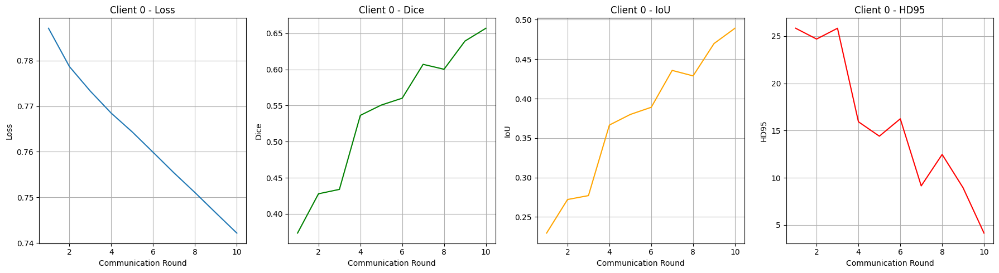

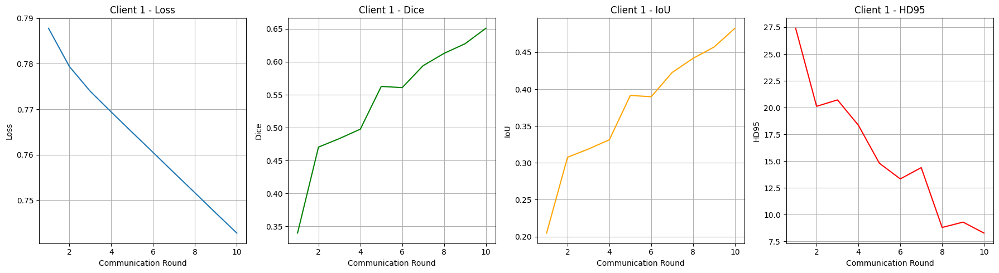

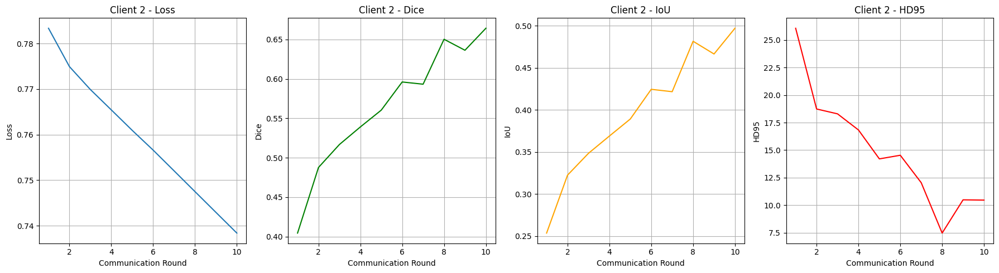

In [ ]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

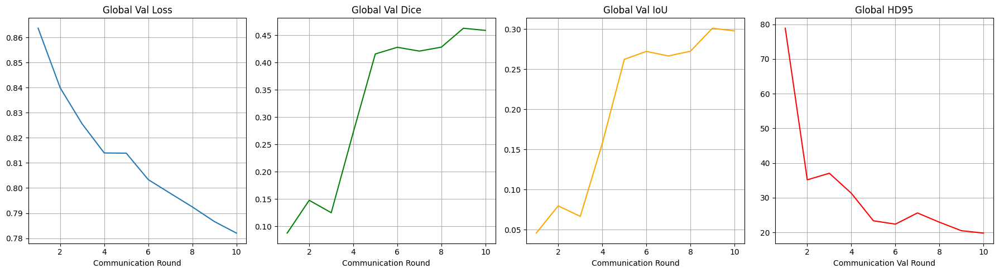

In [ ]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [ ]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_11768\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing:  52%|█████▏    | 26/50 [00:01<00:01, 15.56it/s, Dice=0.4475, IoU=0.2882, HD95=20.2722]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:03<00:00, 15.11it/s, Dice=0.5058, IoU=0.3385, HD95=17.8105]


Test Set Metrics:
Dice: 0.5058
IoU: 0.3385
HD95: 17.8105


**Visualize**

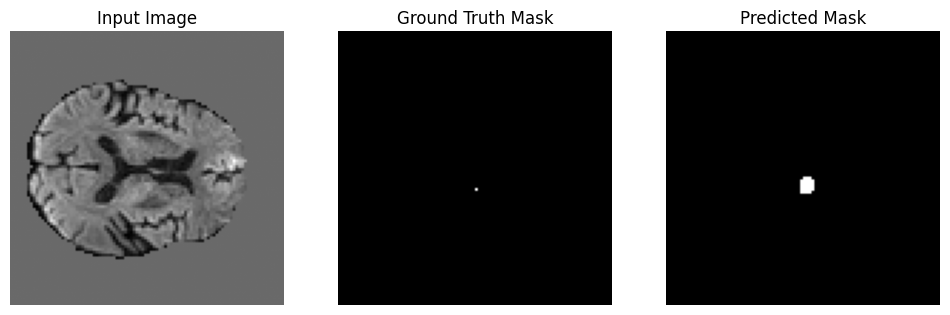

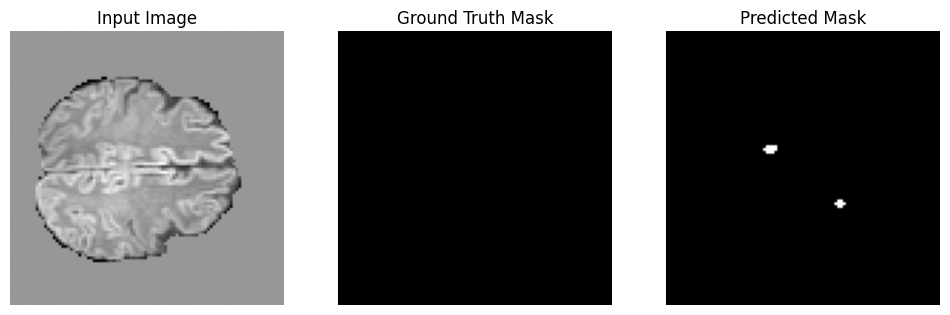

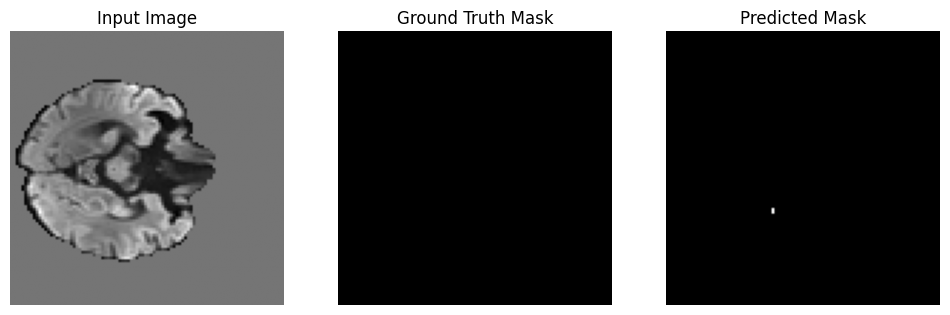

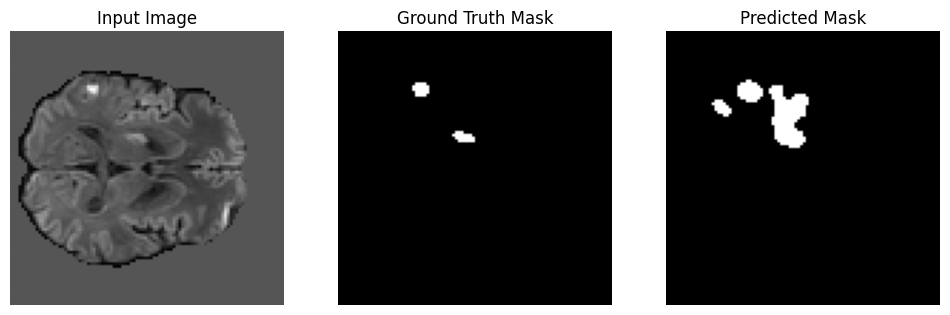

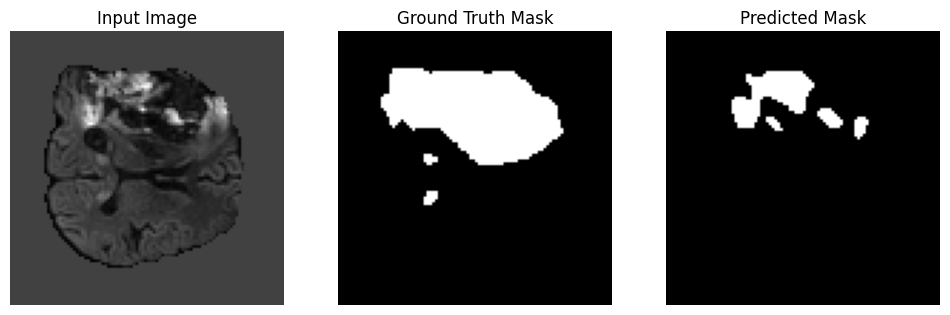

...

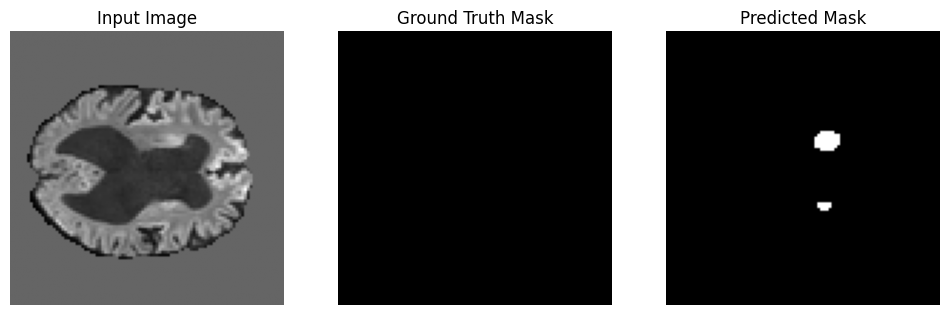

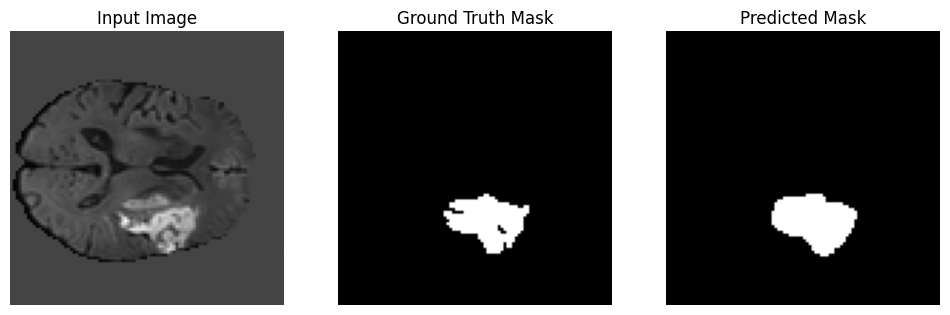

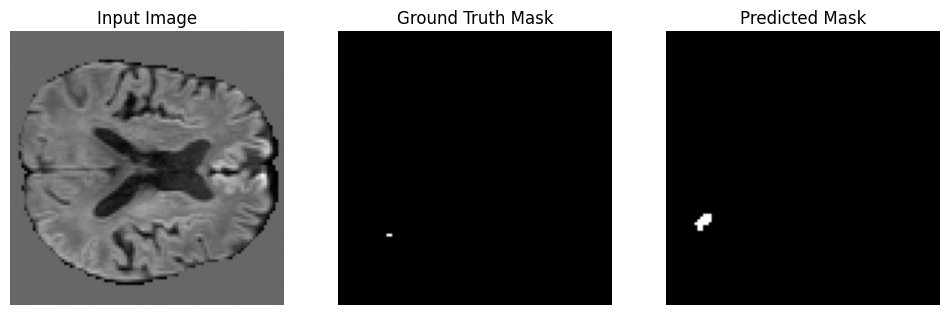

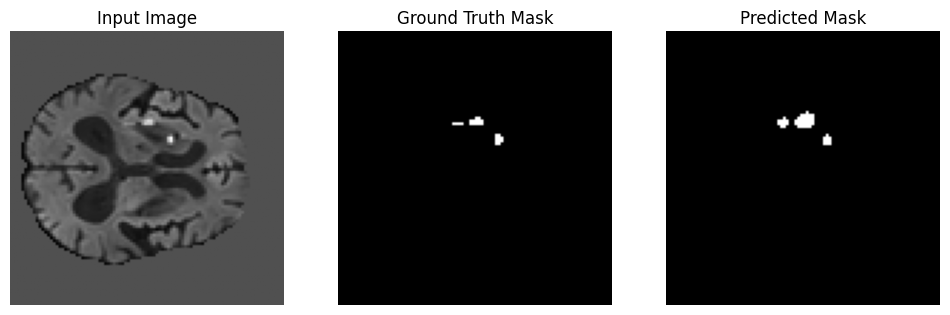

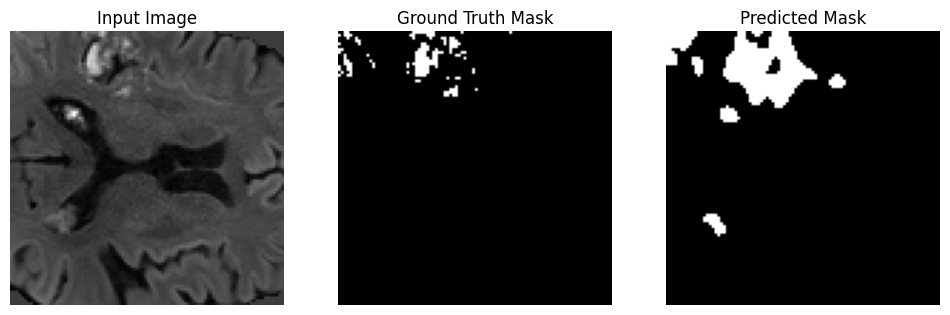

In [ ]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()